## MaxEnt predicted data for wildfire risk



#### Run this cell to connect to your GIS and get started:

In [1]:
from arcgis.gis import GIS
gis = GIS("home")

#### Now you are ready to start!

## Scope / Abstract of the Project: 
Wildfire is a natural hazard that can endanger human life and property. Because of the intricate interaction of numerous environmental elements, predicting the occurrence of wildfires can be difficult. MaxEnt (Maximum Entropy) modeling is a statistical modeling technique used to predict the occurrence of wildfires based on environmental data. MaxEnt has gained favor in recent years as a tool for assessing wildfire risk due to its capacity to accommodate a large number of environmental variables and manage nonlinear interactions between variables.It is possible to generate a prediction surface that shows the predicted probability of fire occurrence in a given area by training a MaxEnt model with historical fire occurrence data and environmental variables such as temperature, precipitation, wind speed, vegetation cover, topography, and land use. This prediction surface can be used to pinpoint high-risk areas and prioritize mitigation measures. MaxEnt modeling can thus play an important role in decreasing the impact of wildfires and enhancing public safety.







## Crisp DM Model:

Business Understanding:

Determine the business objectives of the project, such as reducing the impact of wildfires and improving public safety.
Define the scope of the project, including the geographical area of interest, the variables to be considered, and the data sources available.
Data Understanding:

Collect data on variables that contribute to wildfire risk, such as temperature, precipitation, wind speed, vegetation cover, and historical fire occurrences.
Explore the data to identify missing values, outliers, and other data quality issues.
Preprocess the data using ArcGIS tools, such as the Extract by Mask tool, to extract the data within the area of interest.
Data Preparation:

Prepare the data for use in the MaxEnt model, including converting it to the appropriate format and scaling the variables as necessary.
Split the data into training and validation sets.
Use the MaxEnt tool in ArcGIS to train a predictive model of wildfire risk.
Modeling:

Validate the predictive model by comparing its output to actual fire occurrence data.
Adjust the model as necessary to improve its performance.
Use the model to predict the probability of fire occurrence in the area of interest.
Evaluation:

Evaluate the performance of the predictive model using metrics such as accuracy, precision, and recall.
Compare the predictive model to other available models or methods.
Assess the practical utility of the predictive model, including its ability to identify areas of high risk and inform mitigation efforts.
Deployment:

Deploy the predictive model as a tool for wildfire risk assessment and mitigation.
Communicate the results of the project to stakeholders, such as local fire departments, land managers, and policymakers.
Monitor the performance of the predictive model over time and update it as necessary.
Overall, applying the CRISP-DM model to the problem of predicting wildfires using MaxEnt can help ensure a structured and effective approach to the project, leading to better results and improved public safety.

## Data Preparation:

### Create a Geodatabase to store all data:

In [2]:
# Examine the directory structure
os.listdir('/arcgis/home')

['san_diego_airbnb',
 'Columbus_Ohio_airbnb',
 'Introducing_Location_Intelligence (1).ipynb',
 'LACrimeData.csv',
 'Foursquare',
 'Homework',
 'Homework2',
 'Cities',
 'India',
 'archive (1).zip',
 'CMS',
 'Fire_Muneer-Mogni',
 'Fire_MM',
 'health',
 'India_health_care',
 'CalEnviroScreen_Muneer-Mogni',
 'stran_th.png',
 'citycounty',
 'CrimeDC',
 'ClassworkCrimedata',
 'holc',
 'CrimeIndia',
 'CrimeIndia2',
 'IndiaCrimedata',
 'India_Crime_data',
 'Building_benchmark_data',
 'Building_benchmark_data2',
 'Building_benchmark_data3',
 'Building_benchmark_data5',
 'Building_benchmark_data6',
 'Building_benchmark_data7',
 'san_diego_airbnb2',
 'san_diego_airbnb_Oakland',
 'Oakland_airbnb_',
 'Sanitary_Network',
 'Human_Service_Locations',
 'Asthma',
 'vitcsv.csv',
 'schema.ini',
 'vitcsv.csv.xml',
 'King_County',
 'King_County2',
 'King_County3',
 'county',
 'kc_house.csv',
 'kc_house.csv.xml',
 'pittsburgh_restaurants.gdb',
 'RestaurantClusters_HDBSCAN.shp',
 'RestaurantClusters_HDBSCAN.s

In [3]:
# Create a placeholder folder for the datasets
try:
    dir_name = ('/arcgis/home/Wildfire_MaxEnt')
    os.mkdir(dir_name)
except Exception as exception:
    print (f"{dir_name} already exists.")

/arcgis/home/Wildfire_MaxEnt already exists.


In [4]:
#Create a Directory to store our geodatabase
home_dir = '/arcgis/home/Wildfire_MaxEnt'
new_dirname = 'Prediction'
lesson_dir = os.path.join(home_dir, new_dirname)

In [5]:
MaxEnt = '/arcgis/home/Wildfire_MaxEnt/Prediction.gdb.zip'

In [6]:
import os
import zipfile
import arcpy

In [7]:
#Unzipping the geodatabase
zip_ref = zipfile.ZipFile(MaxEnt, 'r')
zip_ref.extractall(lesson_dir)

In [8]:
#Checking our workspace
print(arcpy.env.workspace)

None


In [9]:
#Assign the geodatabase to Bioclimate
Prediction = os.path.join(lesson_dir, 'Prediction.gdb')

In [10]:
#Assign new workspace
arcpy.env.workspace = Prediction

In [11]:
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Prediction/Prediction.gdb


In [12]:
#List feature classes in geodatabase
arcpy.ListFeatureClasses()

['Fire_Perimeter_21',
 'Percepitation_Probability_Feature',
 'Minimum_Temp_Probability_Feature',
 'Maximum_Temp_Probability_Feature',
 'Average_Temp_Probability_Feature']

In [13]:
#Create a new geodatabase to store results
gp_res = arcpy.management.CreateFileGDB(lesson_dir, 'results_maxent_wildfires_prediction_4.gdb')


In [14]:
gp_res

<Result '/arcgis/home/Wildfire_MaxEnt/Prediction/results_maxent_wildfires_prediction_4.gdb'>

In [15]:
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Prediction/Prediction.gdb


In [16]:
#change workspace to the new geodatabase
arcpy.env.workspace = gp_res[0]
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Prediction/results_maxent_wildfires_prediction_4.gdb


## Literature Review:

Wildfire is a natural danger with serious effects for human life and property, costing billions of dollars each year. The complicated interaction of numerous environmental elements, such as weather, topography, and vegetation cover, makes predicting the occurrence of wildfires difficult. To address this issue, researchers investigated MaxEnt (Maximum Entropy) modeling as a statistical modeling technique for predicting wildfire occurrence based on environmental data.

MaxEnt modeling is a strong method for assessing wildfire risk because it can handle nonlinear interactions between variables and incorporate a large number of environmental parameters. MaxEnt modeling has gained prominence in recent years as a method of predicting wildfire occurrence due to encouraging outcomes in various research.

In one study, Yalcin et al. (2014) employed MaxEnt modeling to predict wildfire occurrence in Turkey's Mediterranean region. The researchers discovered that variables such as land use, temperature, and precipitation were significant predictors of wildfire occurrence, and the MaxEnt model predicted wildfire occurrence with a high level of accuracy.

Similarly, Ayanlade et al. (2018) employed MaxEnt modeling to predict wildfire recurrence in Nigeria. Temperature, precipitation, and wind speed were discovered to be major determinants of wildfire occurrence, and the MaxEnt model performed well in forecasting wildfire occurrence.

Overall, multiple research have demonstrated that using MaxEnt modeling to predict wildfire occurrence is promising. MaxEnt modeling can assist identify areas of high fire risk and prioritize mitigation measures by including a wide range of environmental variables and handling nonlinear interactions between variables, thereby enhancing public safety and lowering the impact of wildfires. More research is needed, however, to fully grasp MaxEnt modeling's potential in predicting wildfire occurrence, particularly its efficacy in diverse regions and under different environmental conditions.



## DATA  FILTERATION AND STUDY AREA:

### 1. Fire Layer 2021

In [17]:
#Let’s visualize it on a map
import pandas as pd
from arcgis.features import GeoAccessor

In [18]:
Fire_Perimeter_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Fire_Perimeter_21'))

In [19]:
#plots the data to the map view
map_view = Fire_Perimeter_2021_sdf.spatial.plot(alpha=0.10)
Fire_Perimeter_2021_sdf.spatial.plot(map_widget=map_view,
                renderer_type='s',
                symbol_type='simple',
                symbol_style='d', # d - for diamonds
                colors='Reds_r',
                cstep=50,
                outline_color='Blues',
                marker_size=10)
map_view

MapView(layout=Layout(height='400px', width='100%'))

In [20]:
Fire_Perimeter_2021_df = Fire_Perimeter_2021_sdf.head(1000)
Fire_Perimeter_2021_df

,OBJECTID,YEAR_,STATE,AGENCY,UNIT_ID,FIRE_NAME,INC_NUM,ALARM_DATE,CONT_DATE,CAUSE,COMMENTS,REPORT_AC,GIS_ACRES,C_METHOD,OBJECTIVE,FIRE_NUM,COMPLEX_NAME,COMPLEX_INCNUM,ORIG_FID,SHAPE
0,1,2021,CA,CDF,BDU,CALVERT,00000573,2021-03-01,2021-03-01,18,"197ac w/in project,73 out of proj, INC_NUM nee...",270.00,257.832275,1,1.0,None,None,None,42800,"{""x"": 157631.76080000028, ""y"": -112181.0581999..."
1,2,2021,CA,LRA,SKU,MEISS,00002480,2021-04-05,2021-04-05,5,,21.88,21.863773,1,1.0,None,None,None,42801,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
2,3,2021,CA,LRA,SKU,REFUGE,00002246,2021-03-27,2021-03-29,18,,874.00,873.391724,1,1.0,None,None,None,42802,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
3,4,2021,CA,CDF,CZU,BONNY COMPLEX,00000468,2021-01-19,2021-01-22,9,None,20.31,20.307356,7,1.0,None,BONNY COMPLEX,00000468,42803,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
4,5,2021,CA,CDF,CZU,FREEDOM,00000489,2021-01-19,2021-01-22,11,None,37.00,33.259224,1,1.0,None,None,None,42804,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,372,2021,CA,USF,KNF,RIVER COMPLEX,00006385,2021-07-31,2021-10-25,1,"includes Haypress -INC #00006414-, Summer -INC...",155752.00,199354.093750,7,1.0,None,RIVER COMPLEX,00006385,43183,"{""x"": -250968.42899999954, ""y"": 348576.1225000..."
372,373,2021,CA,CDF,RRU,COYOTE,00073166,2021-06-02,2021-06-06,9,456D9A2D-878B-4900-B93D-DAF115559CF0,43.00,42.754890,1,1.0,None,None,None,43184,"{""x"": 287539.1832999997, ""y"": -453999.00380000..."
373,374,2021,CA,CDF,BDU,DEVORE,00005483,2021-05-04,2021-05-04,9,7A114986-F379-4905-B44F-10240256EF10,14.00,13.806909,1,1.0,None,None,None,43185,"{""x"": 236472.29720000178, ""y"": -415782.7609999..."
374,375,2021,CA,USF,BDF,LONE,00010482,2021-07-04,2021-07-05,9,7A114986-F379-4905-B44F-10240256EF10,8.44,8.430901,1,1.0,None,None,None,43187,"{""x"": 233666.83659999818, ""y"": -414415.7785, ""..."


In [21]:
# Exploring the dataset attributs
Fire_Perimeter_2021_df.columns

Index(['OBJECTID', 'YEAR_', 'STATE', 'AGENCY', 'UNIT_ID', 'FIRE_NAME',
       'INC_NUM', 'ALARM_DATE', 'CONT_DATE', 'CAUSE', 'COMMENTS', 'REPORT_AC',
       'GIS_ACRES', 'C_METHOD', 'OBJECTIVE', 'FIRE_NUM', 'COMPLEX_NAME',
       'COMPLEX_INCNUM', 'ORIG_FID', 'SHAPE'],
      dtype='object')

In [25]:
Fire_Perimeter_2021_Layer = Fire_Perimeter_2021_df.spatial.to_featurelayer(title='Fireperimeter2021_Layer',tags=['2021'])
Fire_Perimeter_2021_Layer

<Item title:"Fireperimeter2021_Layer" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

In [22]:
map_view_1 = Fire_Perimeter_2021_df.spatial.plot(alpha=0.10)
Fire_Perimeter_2021_sdf.spatial.plot(map_widget=map_view_1,
                renderer_type='s',
                symbol_type='simple',
                symbol_style='d', # d - for diamonds
                colors='Reds_r',
                cstep=50,
                outline_color='Blues',
                marker_size=10)
map_view_1

MapView(layout=Layout(height='400px', width='100%'))

## Data Collection from Worldclim.org:

Climate data from WorldClim version 2.1 is a great resource for scholars and practitioners in a variety of sectors. This dataset, which was released in January 2020, contains monthly climatic data for the minimum, mean, and maximum temperature, precipitation, solar radiation, wind speed, water vapor pressure, and total precipitation. In addition, 19 "bioclimatic" variables can be utilized to simulate species distributions and other ecological processes.

The spatial resolution of this dataset, which varies from 30 seconds (1 km2) to 10 minutes (340 km2), is one of its merits. This enables a wide range of applications, ranging from regional to worldwide investigations. Furthermore, the monthly resolution of the data enables for the examination of seasonal patterns and trends in climate variables.

The data is also presented in an easy-to-use format, with each download consisting of a "zip" file containing 12 GeoTiff (.tif) files, one for each month of the year. This facilitates data manipulation in various GIS and statistical software applications.

Overall, WorldClim version 2.1 climate data is a significant resource for ecologists, biogeographers, climatologists, and conservation biologists. Its high spatial and temporal resolution, as well as the availability of bioclimatic variables, make it a useful dataset for a variety of applications.



## 1. Minimum Temperature(1970 - 2000): Monthly average data Jan - Dec 12 Months

In [23]:
# arcpy.read_tif("filename")

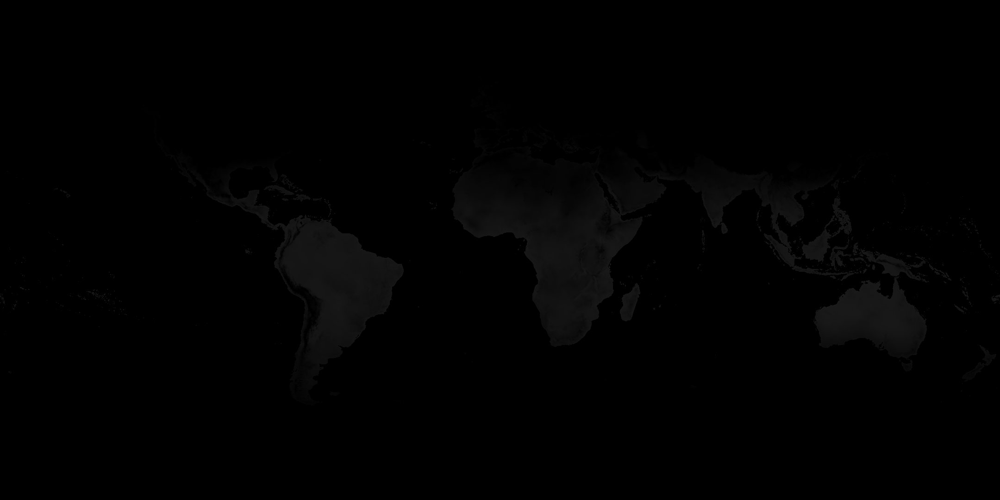

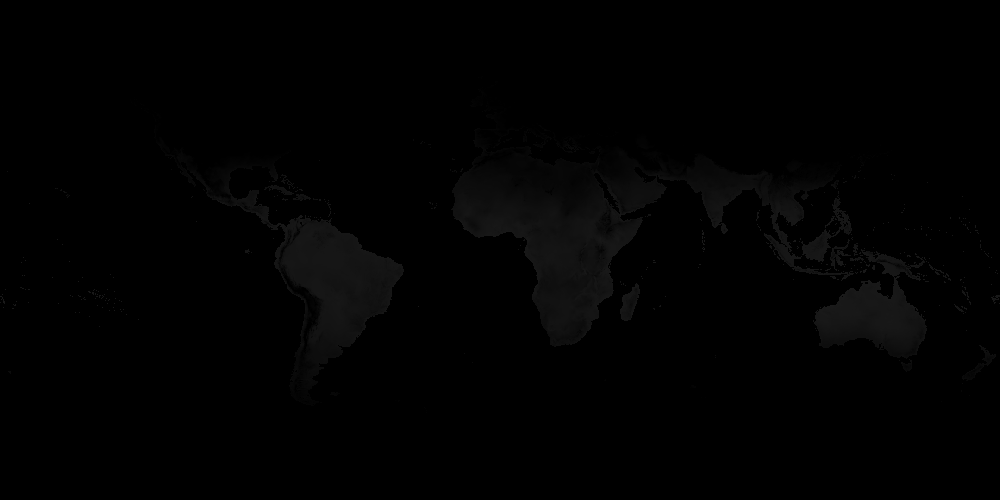

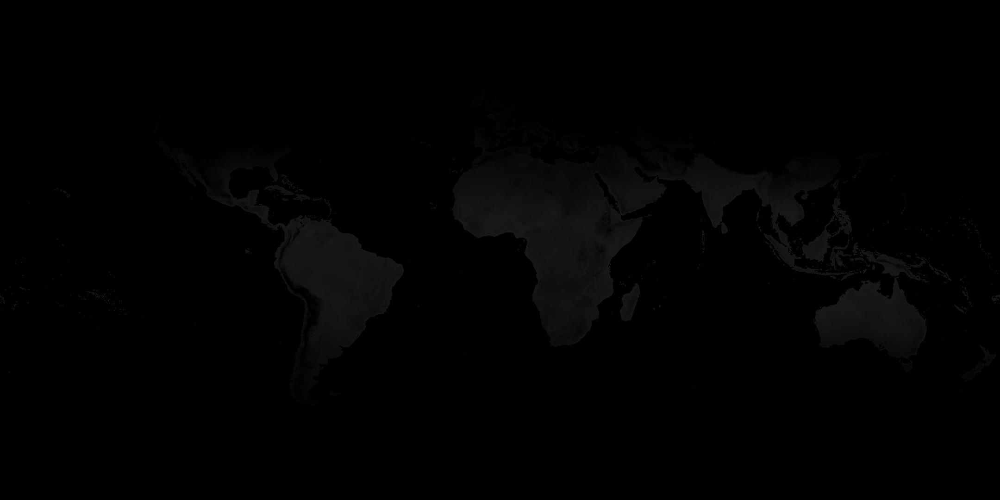

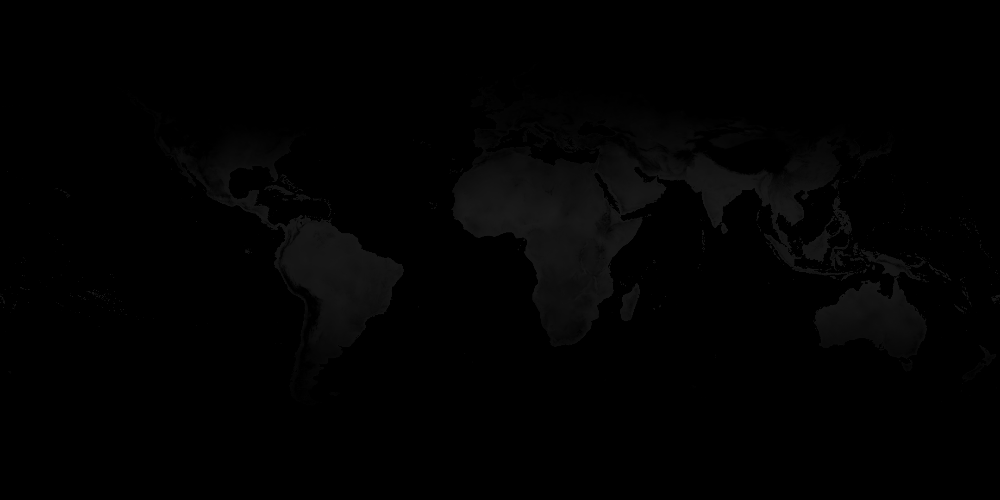

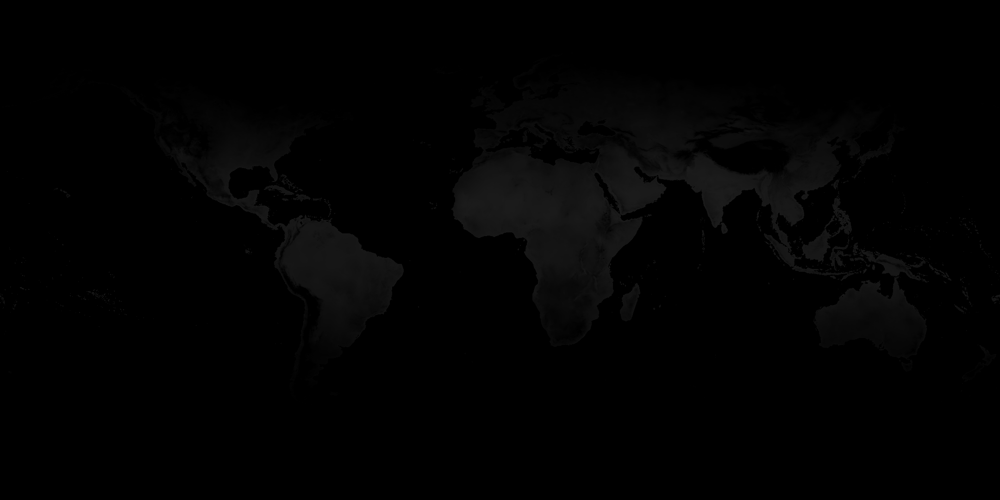

...

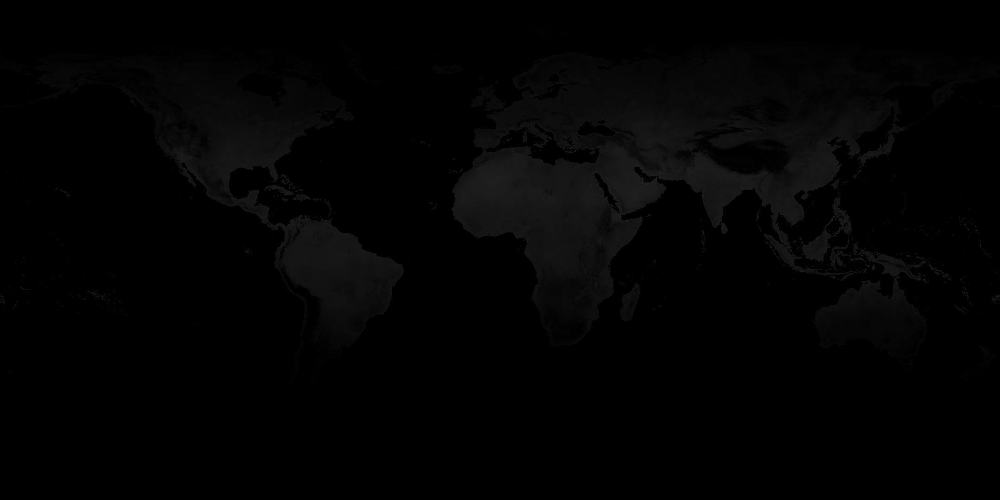

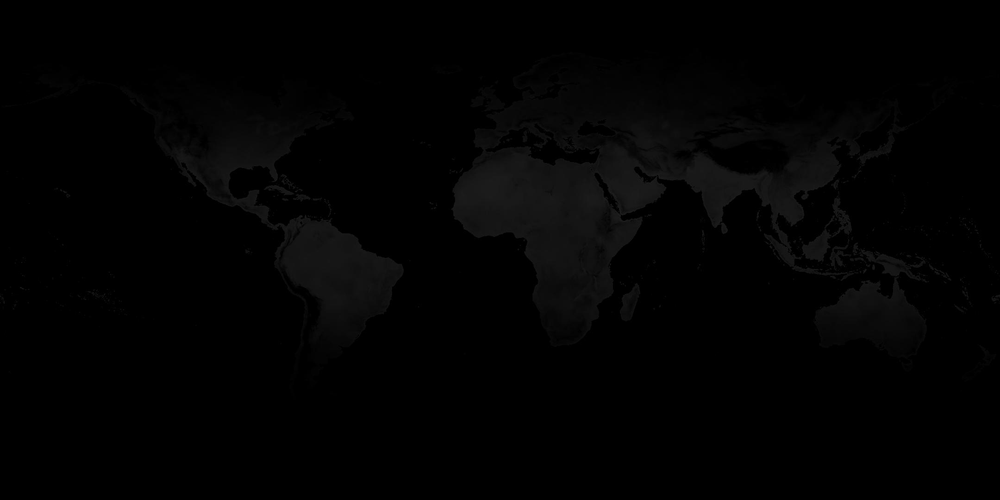

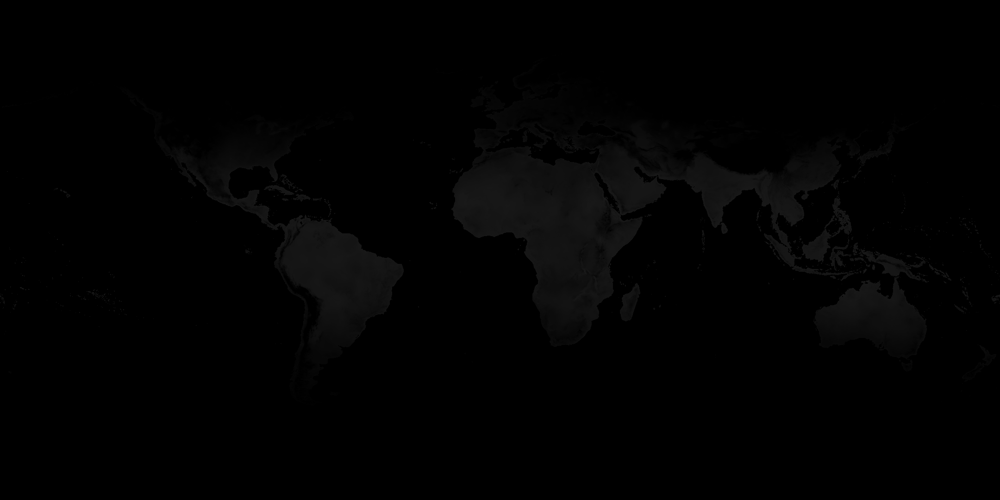

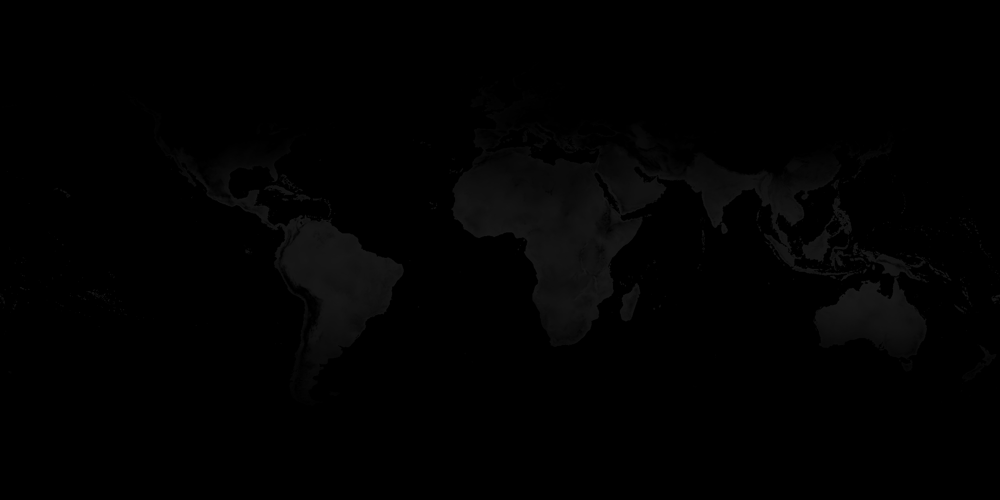

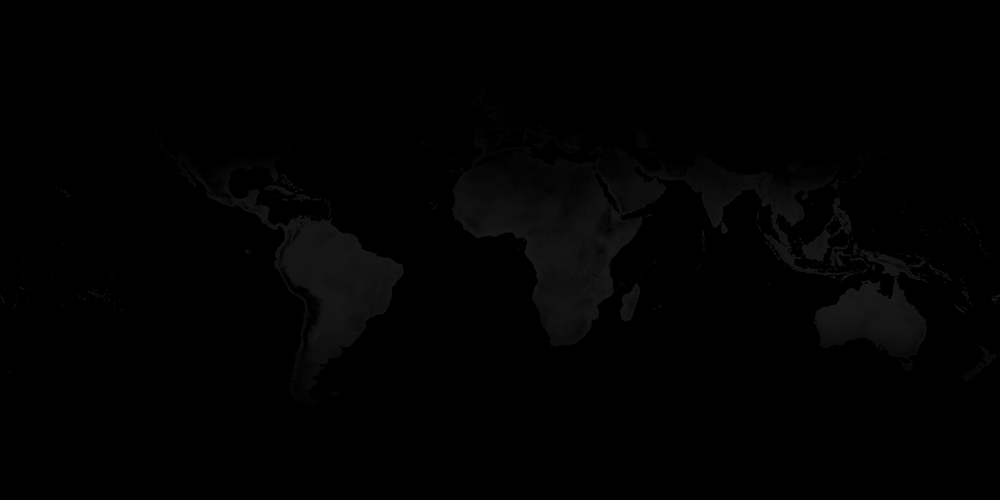

In [24]:
from PIL import Image
images = ["wc2.1_10m_tmin_01", "wc2.1_10m_tmin_02", "wc2.1_10m_tmin_03", "wc2.1_10m_tmin_04",
       "wc2.1_10m_tmin_05", "wc2.1_10m_tmin_06", "wc2.1_10m_tmin_07", "wc2.1_10m_tmin_08",
       "wc2.1_10m_tmin_09", "wc2.1_10m_tmin_10", "wc2.1_10m_tmin_11", "wc2.1_10m_tmin_12"]
for i in images:
    im = Image.open('/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/location/' + i + '.tif')
    im.show()

## 2. Maximum Temperature(1970 - 2000)

In [25]:
import zipfile

# Define the path to the zip file and the destination folder for the unzipped files
zip_path = '/arcgis/home/Wildfire_MaxEnt/wc2.1_10m_tmax.zip'
dest_folder = '/arcgis/home/Wildfire_MaxEnt/Maximum_Temp'

# Open the zip file and extract its contents to the destination folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dest_folder)


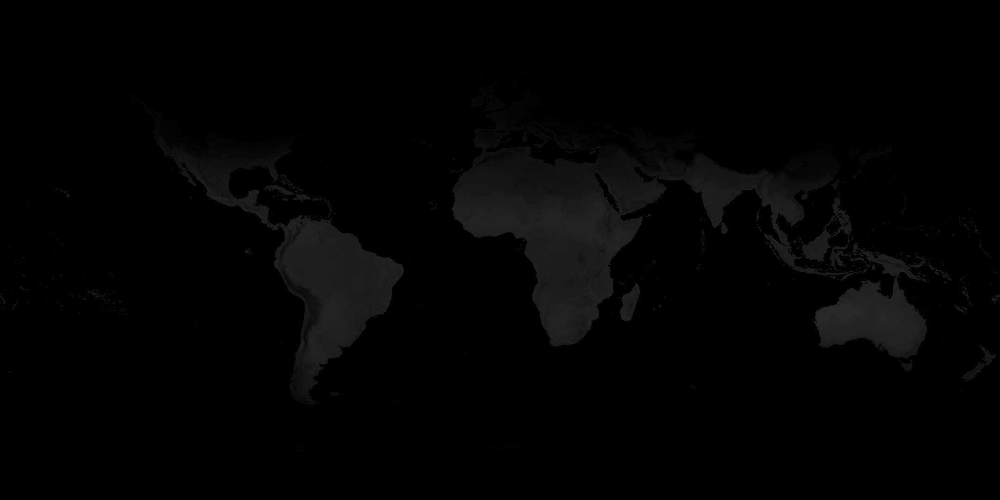

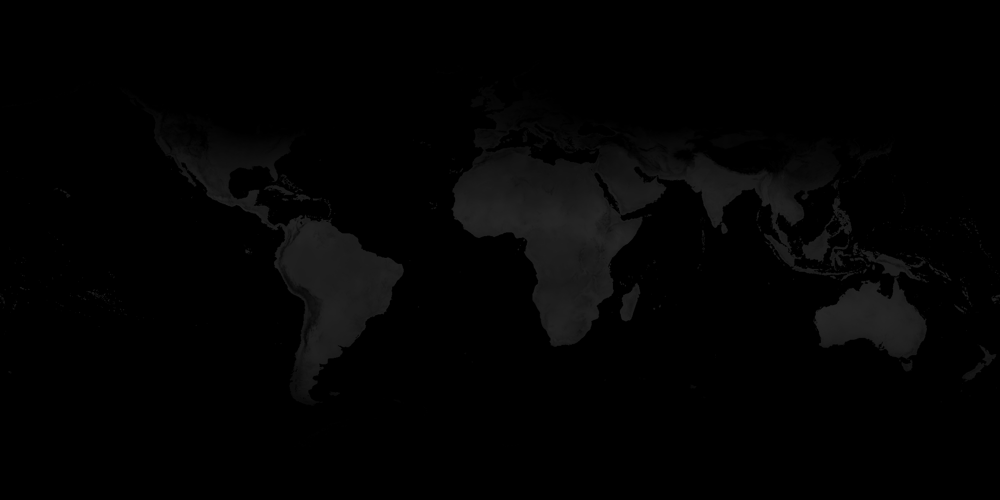

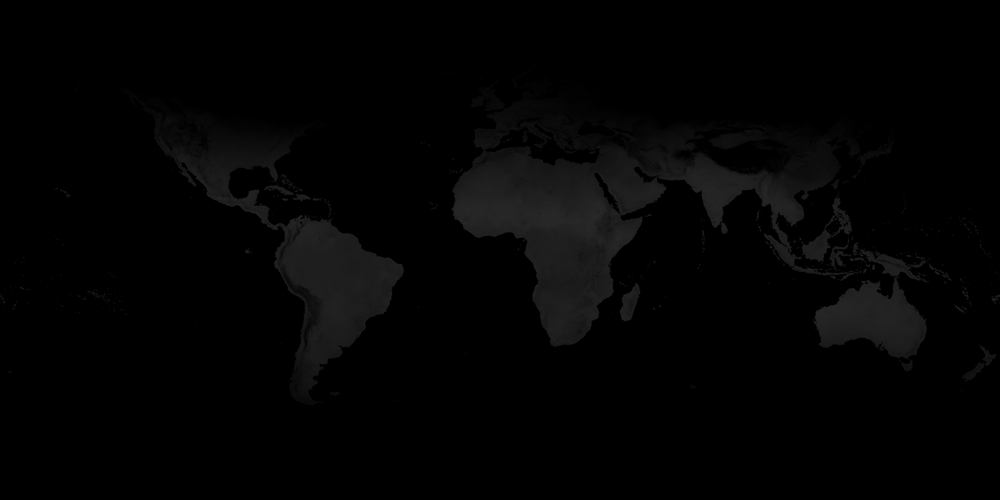

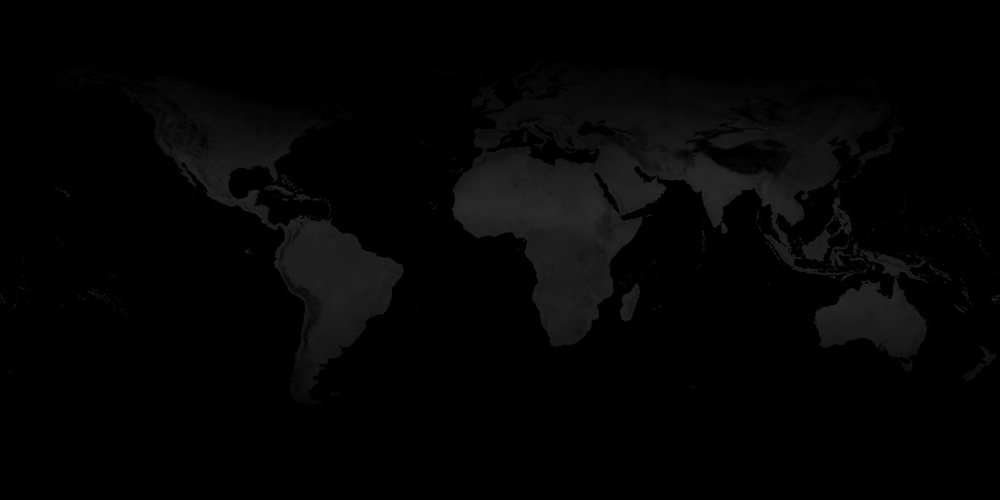

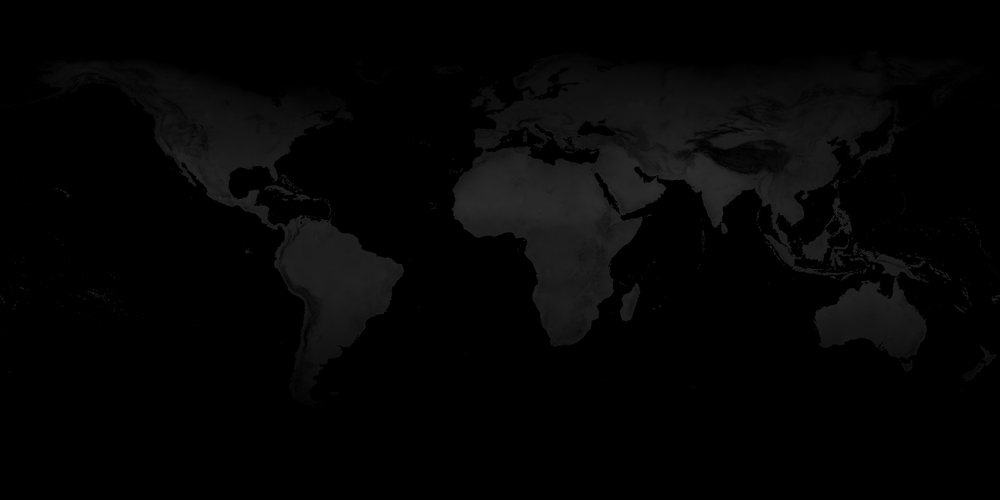

...

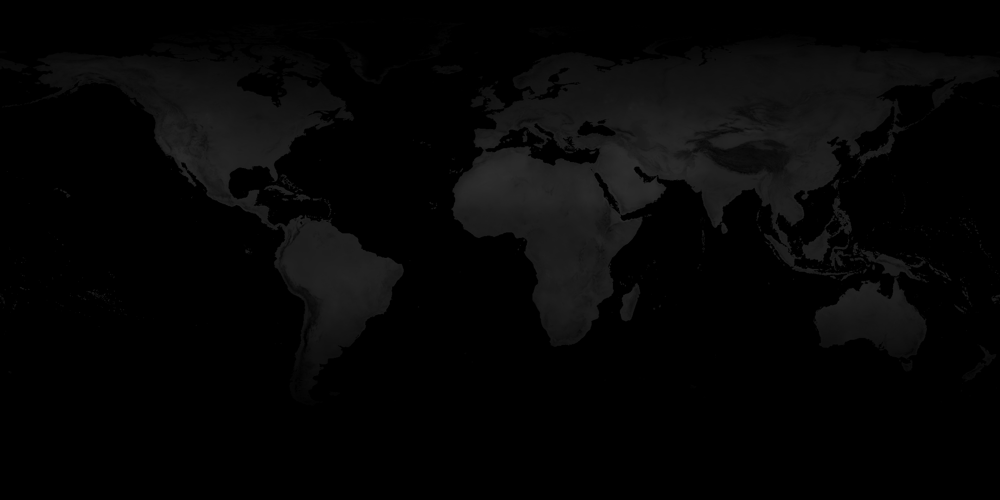

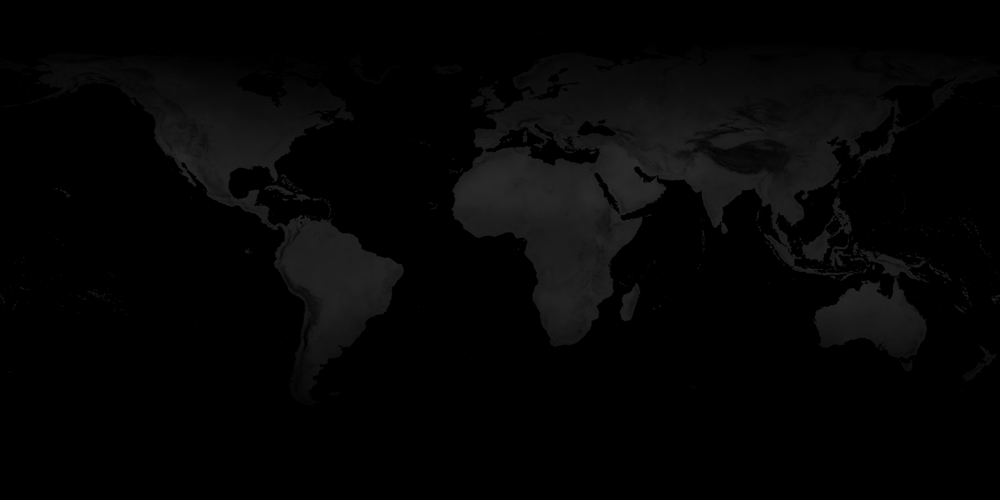

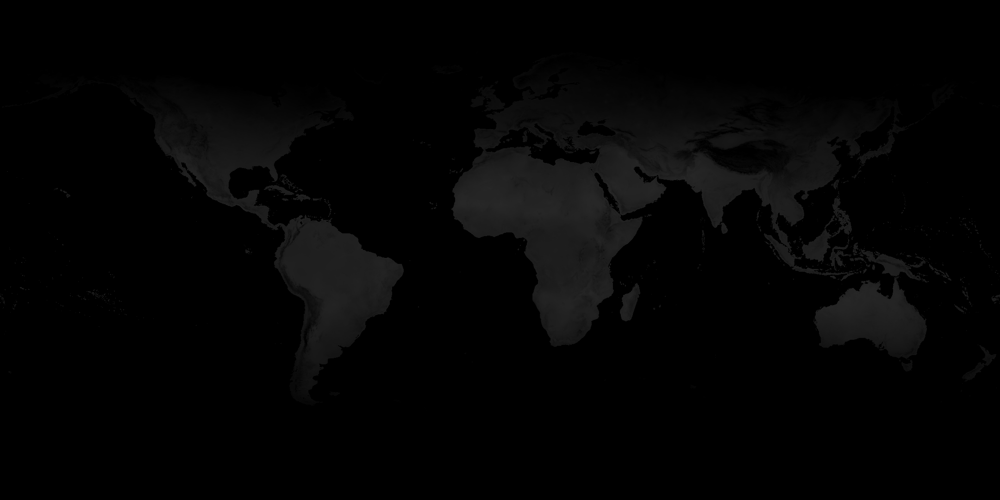

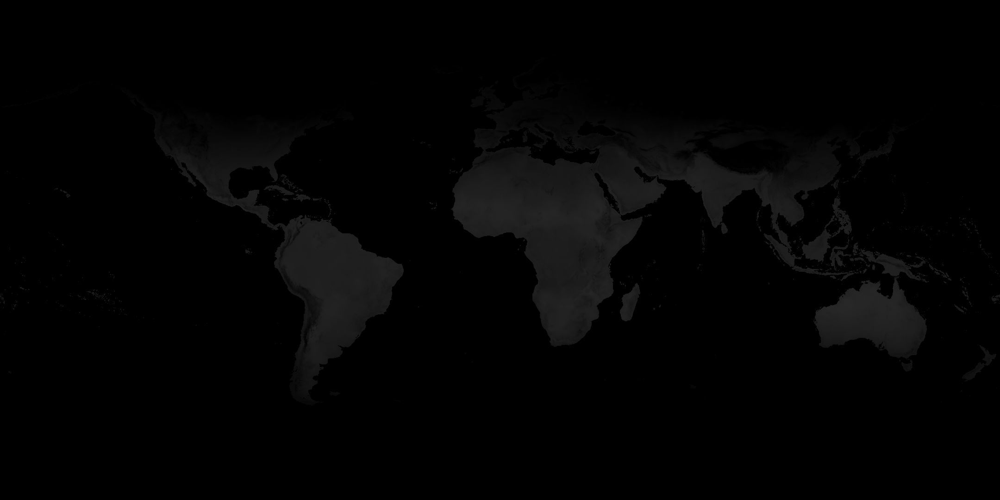

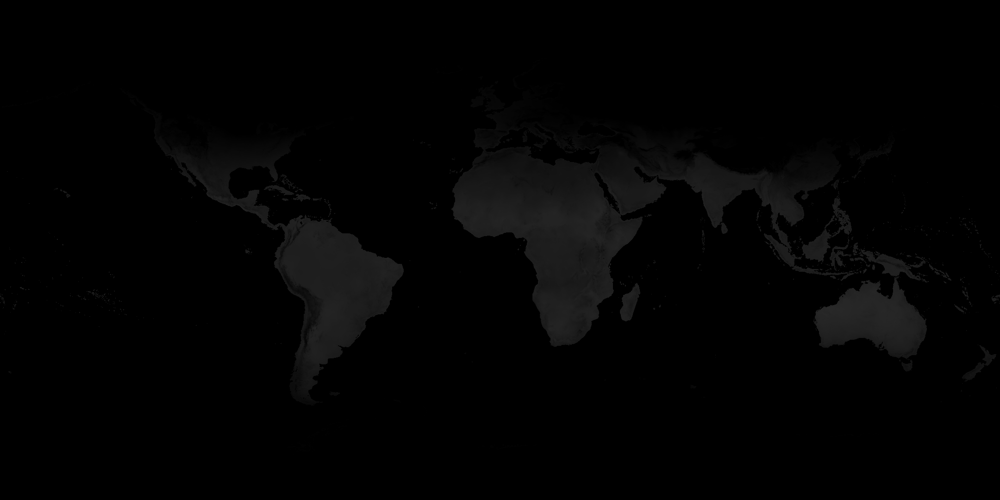

In [26]:
from PIL import Image
images = ["wc2.1_10m_tmax_01", "wc2.1_10m_tmax_02", "wc2.1_10m_tmax_03", "wc2.1_10m_tmax_04",
       "wc2.1_10m_tmax_05", "wc2.1_10m_tmax_06", "wc2.1_10m_tmax_07", "wc2.1_10m_tmax_08",
       "wc2.1_10m_tmax_09", "wc2.1_10m_tmax_10", "wc2.1_10m_tmax_11", "wc2.1_10m_tmax_12"]
for i in images:
    im = Image.open('/arcgis/home/Wildfire_MaxEnt/Maximum_Temp/' + i + '.tif')
    im.show()

## 3. Maximum Temperature

In [27]:
import zipfile

# Define the path to the zip file and the destination folder for the unzipped files
zip_path = '/arcgis/home/Wildfire_MaxEnt/wc2.1_10m_tavg.zip'
dest_folder = '/arcgis/home/Wildfire_MaxEnt/Average_Temp'

# Open the zip file and extract its contents to the destination folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dest_folder)


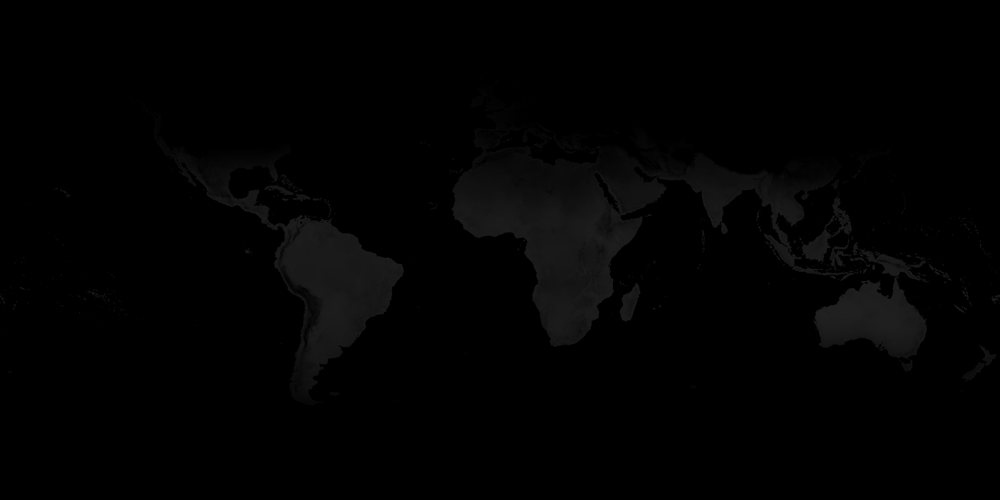

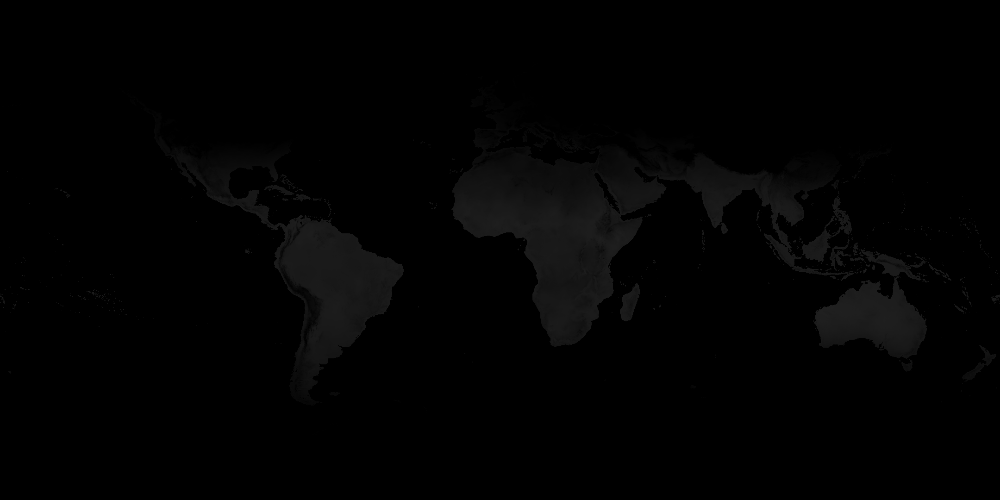

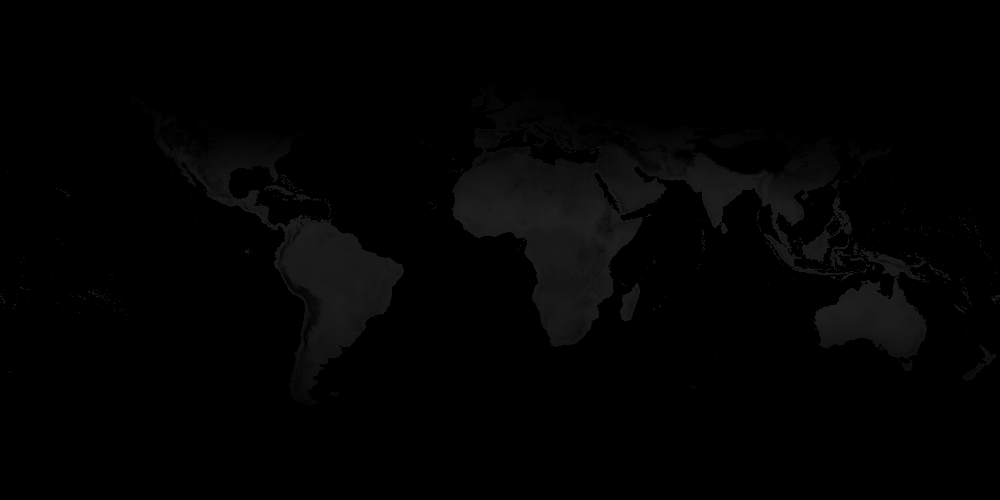

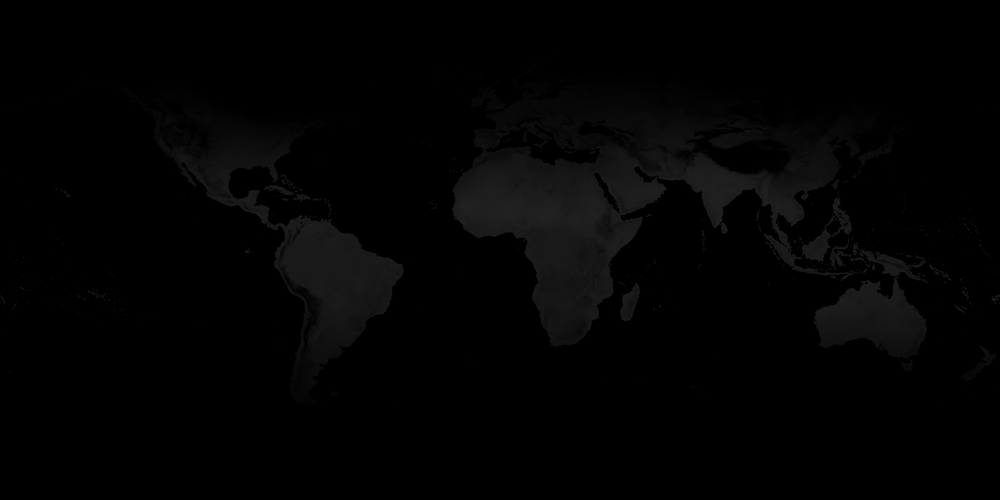

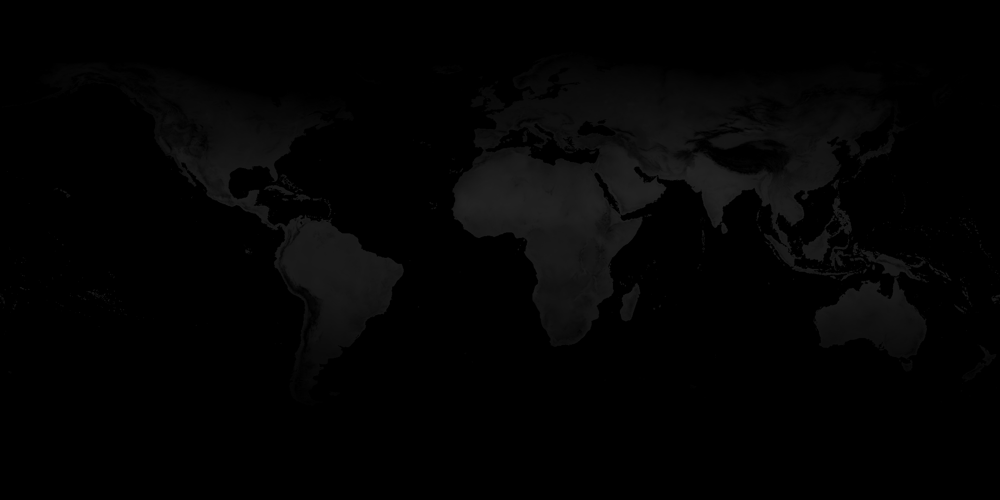

...

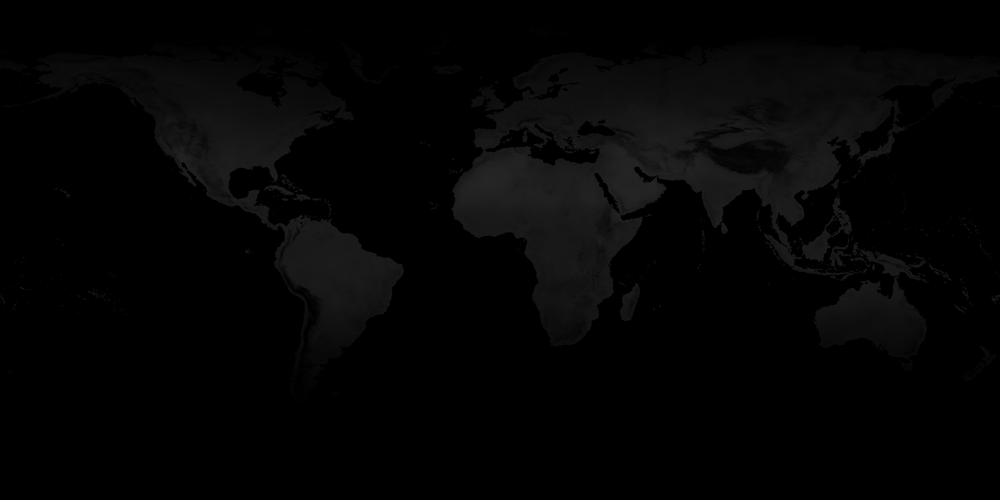

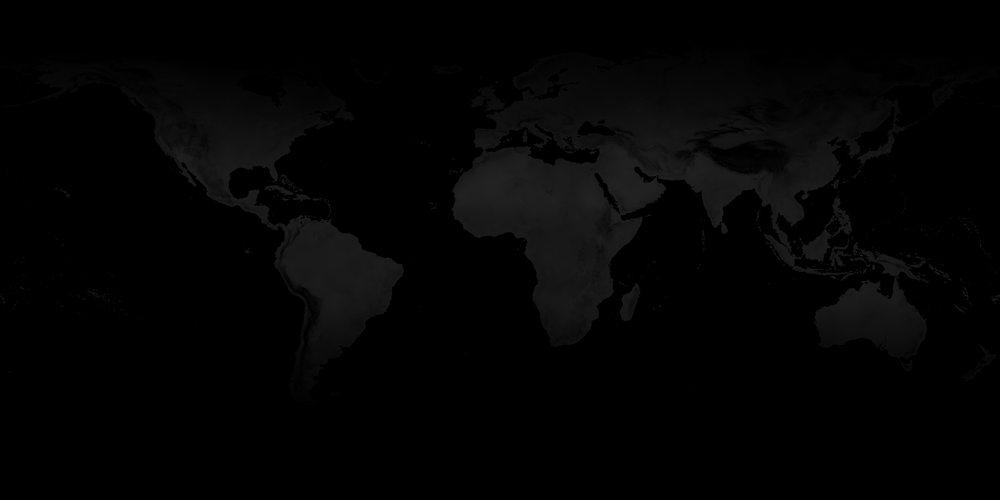

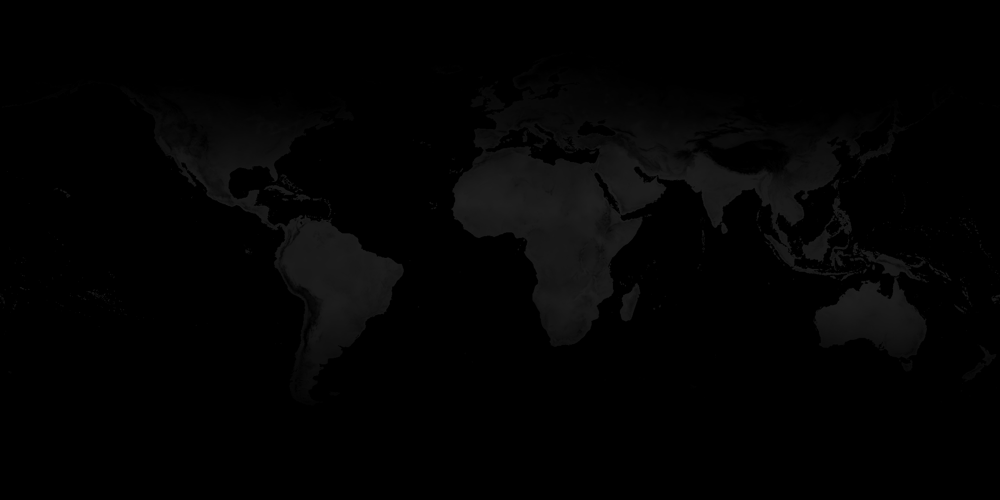

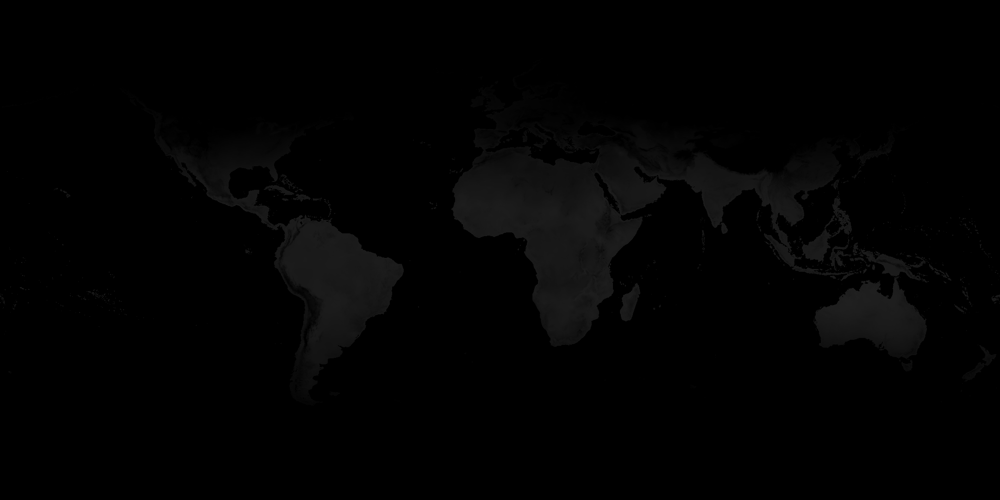

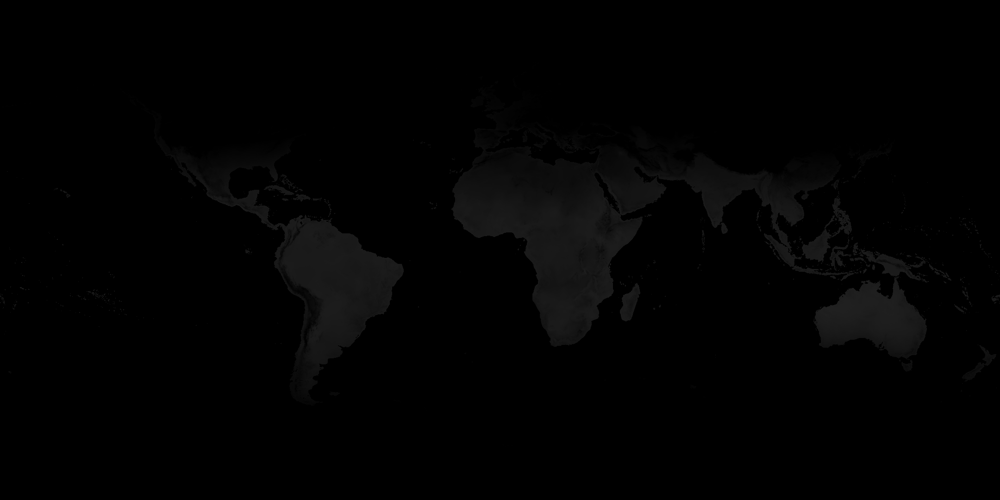

In [28]:
from PIL import Image
images = ["wc2.1_10m_tavg_01", "wc2.1_10m_tavg_02", "wc2.1_10m_tavg_03", "wc2.1_10m_tavg_04",
       "wc2.1_10m_tavg_05", "wc2.1_10m_tavg_06", "wc2.1_10m_tavg_07", "wc2.1_10m_tavg_08",
       "wc2.1_10m_tavg_09", "wc2.1_10m_tavg_10", "wc2.1_10m_tavg_11", "wc2.1_10m_tavg_12"]
for i in images:
    im = Image.open('/arcgis/home/Wildfire_MaxEnt/Average_Temp/' + i + '.tif')
    im.show()

## 4. Average Temperature

In [29]:
import zipfile

# Define the path to the zip file and the destination folder for the unzipped files
zip_path = '/arcgis/home/Wildfire_MaxEnt/wc2.1_10m_prec.zip'
dest_folder = '/arcgis/home/Wildfire_MaxEnt/Percipitation_Layer'

# Open the zip file and extract its contents to the destination folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dest_folder)

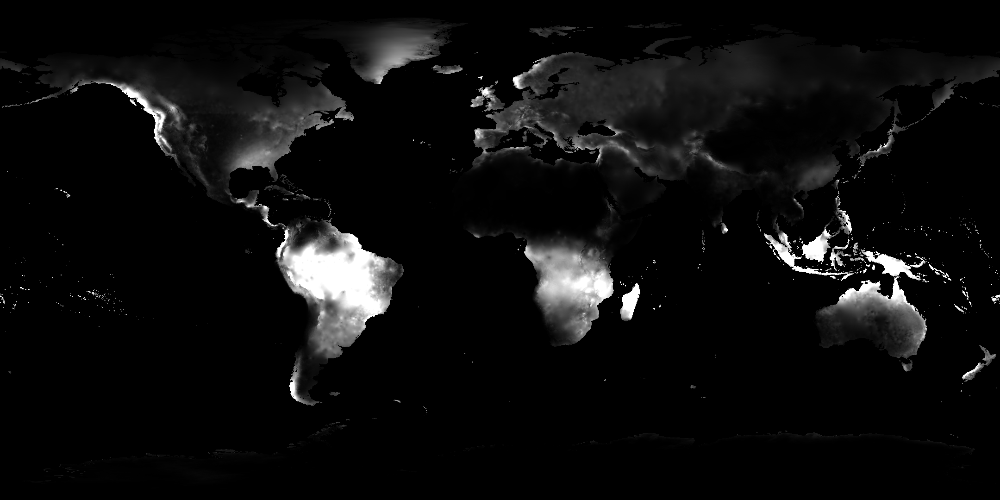

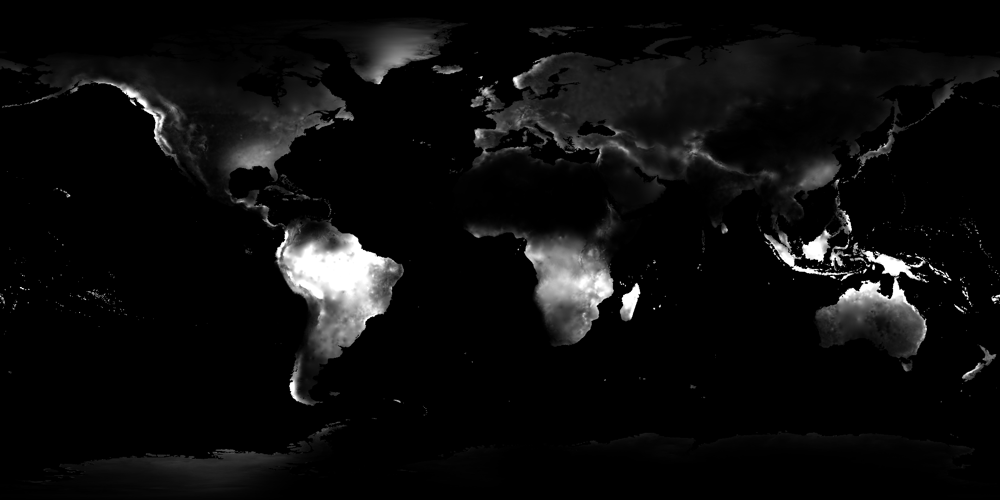

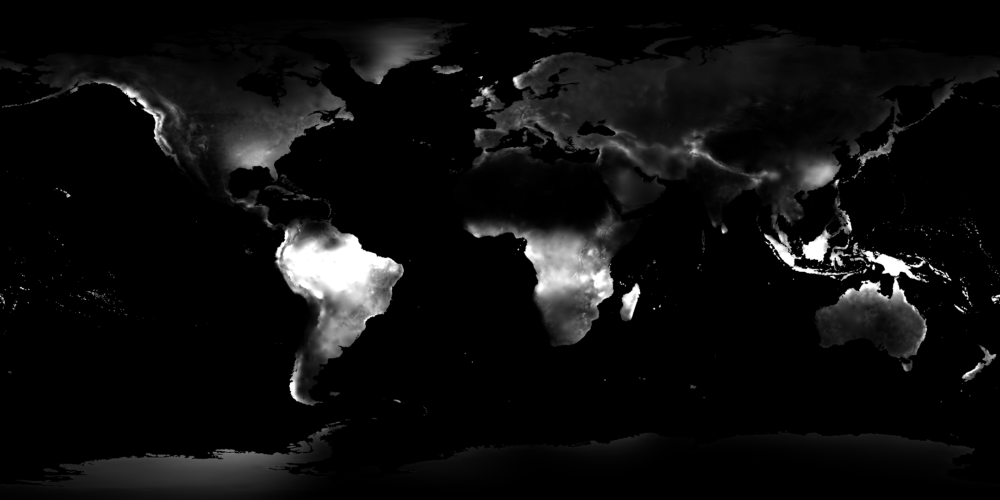

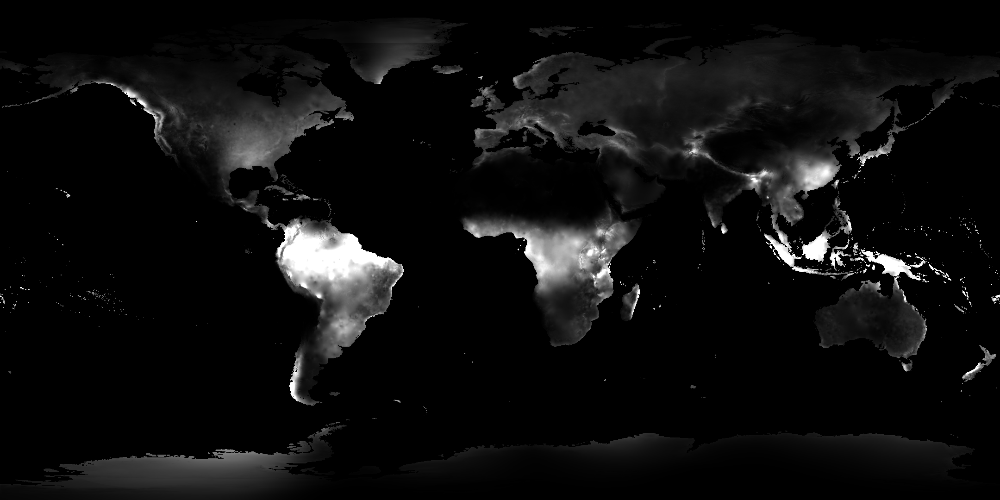

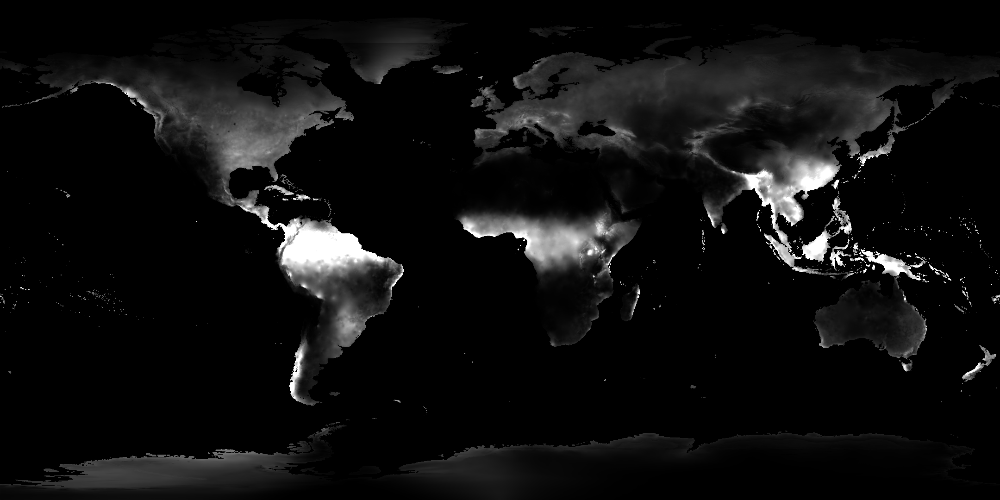

...

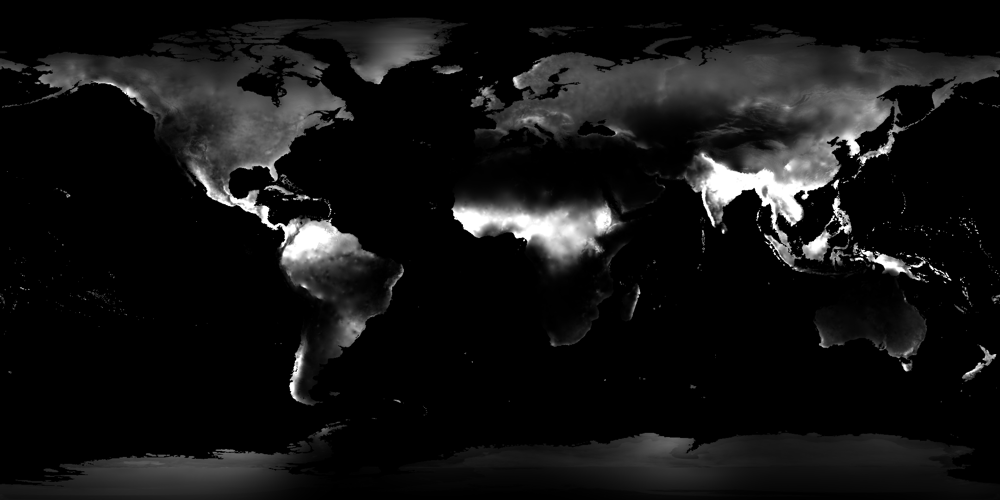

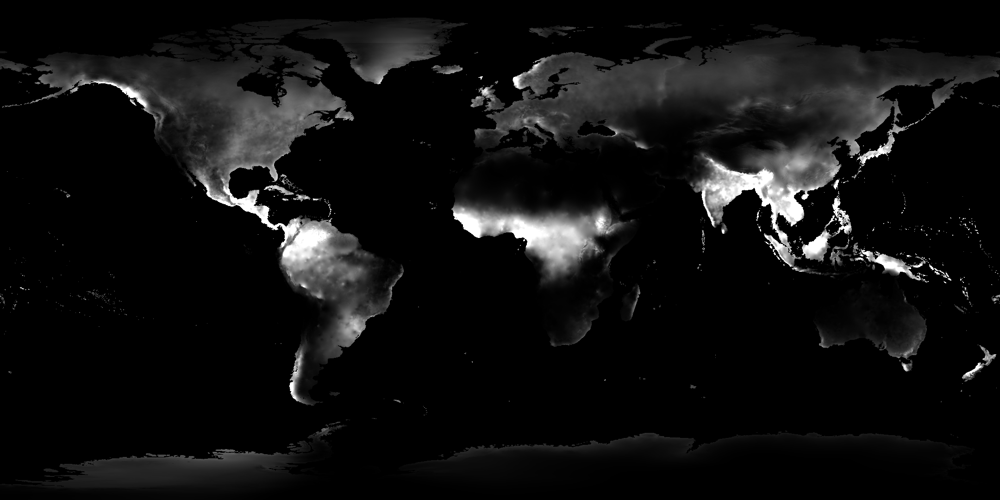

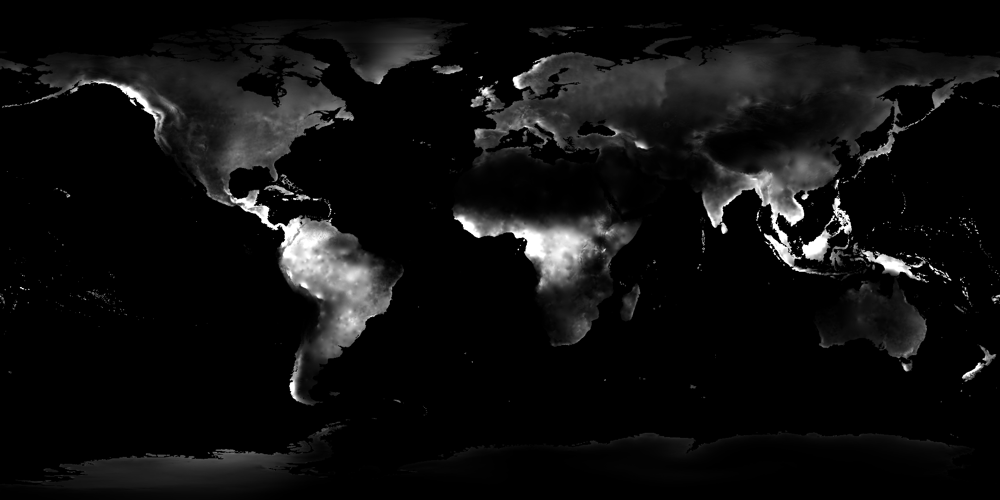

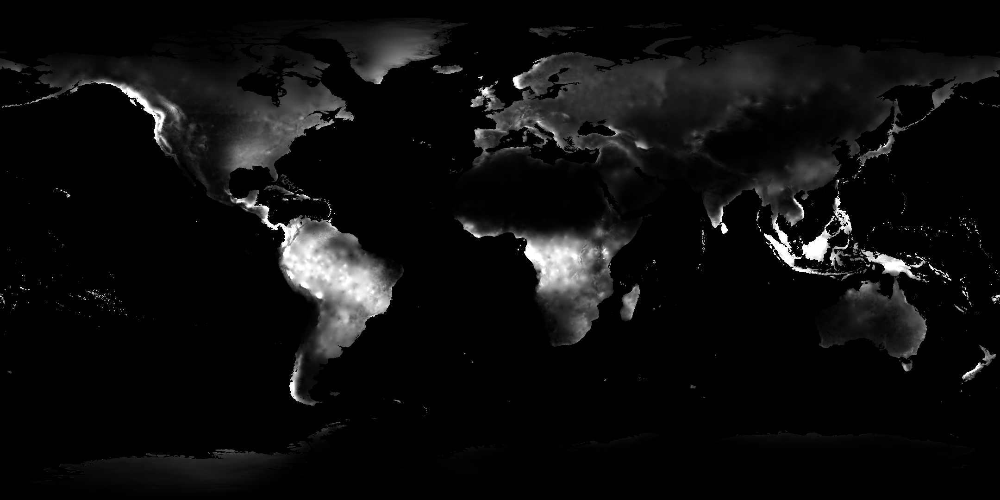

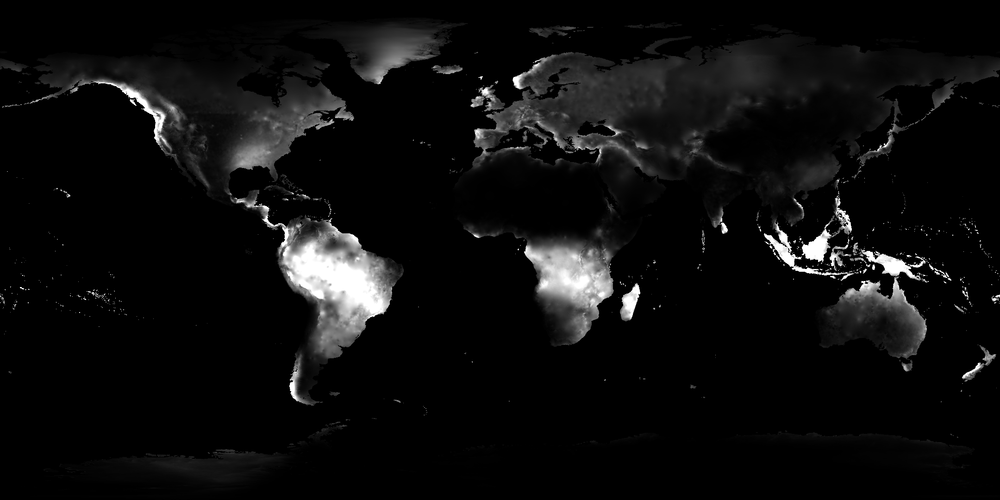

In [30]:
from PIL import Image
images = ["wc2.1_10m_prec_01", "wc2.1_10m_prec_02", "wc2.1_10m_prec_03", "wc2.1_10m_prec_04",
       "wc2.1_10m_prec_05", "wc2.1_10m_prec_06", "wc2.1_10m_prec_07", "wc2.1_10m_prec_08",
       "wc2.1_10m_prec_09", "wc2.1_10m_prec_10", "wc2.1_10m_prec_11", "wc2.1_10m_prec_12"]
for i in images:
    im = Image.open('/arcgis/home/Wildfire_MaxEnt/Percipitation_Layer/' + i + '.tif')
    im.show()

## 5. Wind Speed


In [31]:
import zipfile

# Define the path to the zip file and the destination folder for the unzipped files
zip_path = '/arcgis/home/Wildfire_MaxEnt/wc2.1_10m_wind.zip'
dest_folder = '/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer'

# Open the zip file and extract its contents to the destination folder
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(dest_folder)

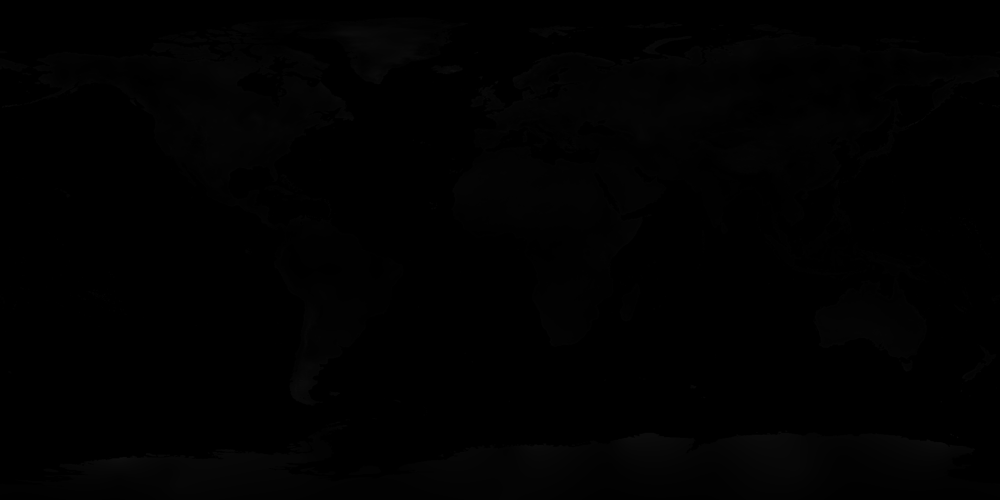

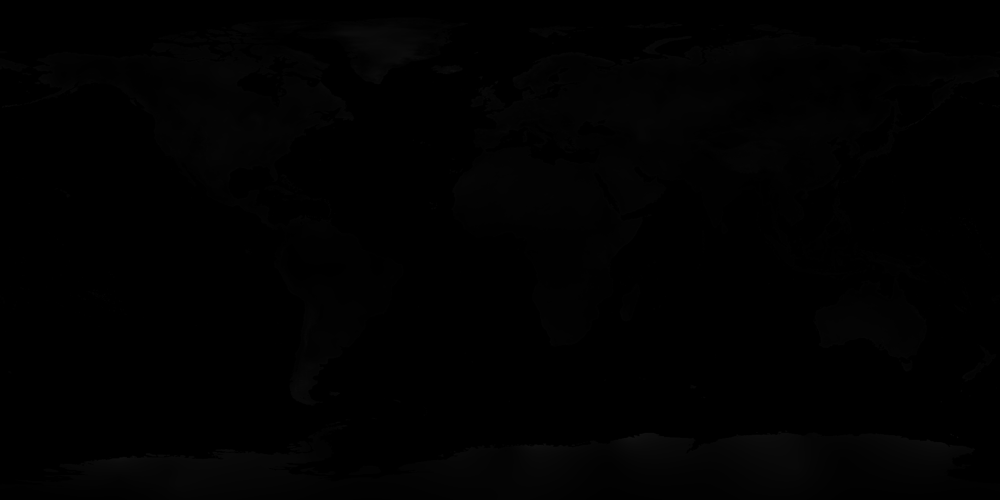

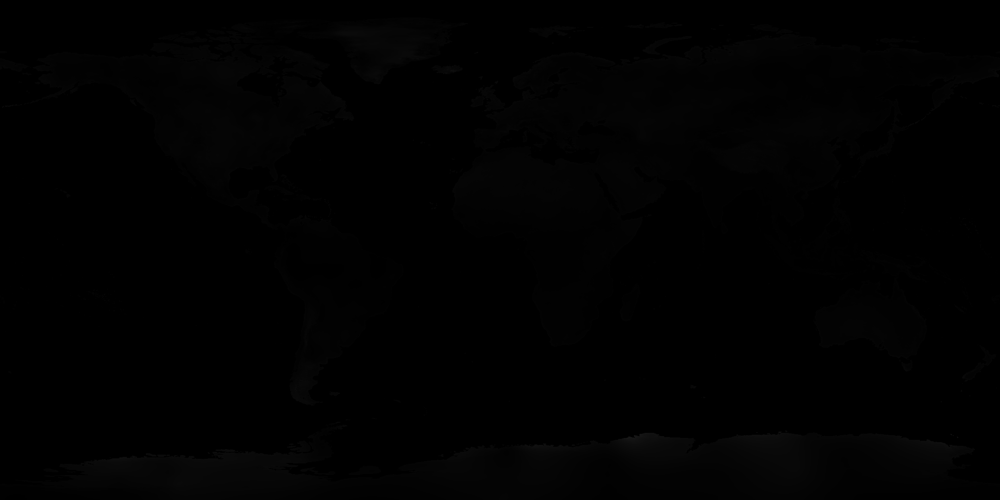

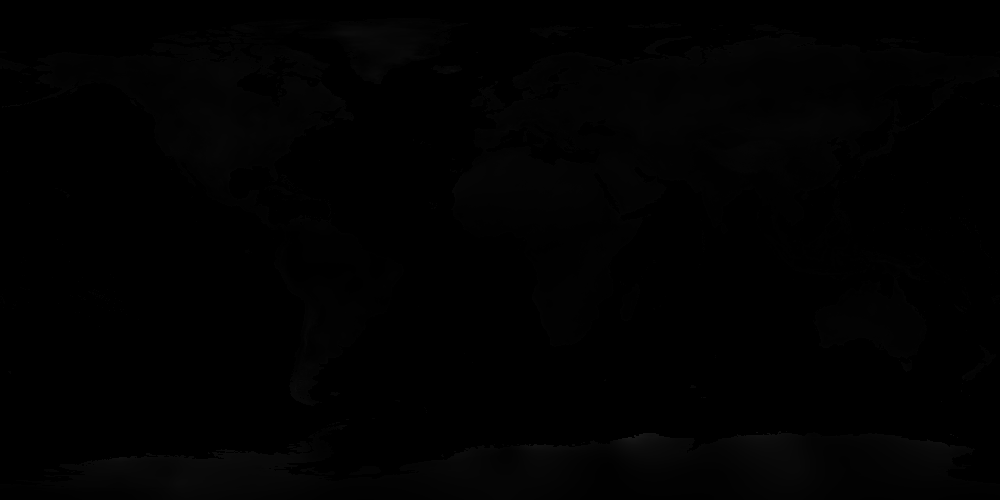

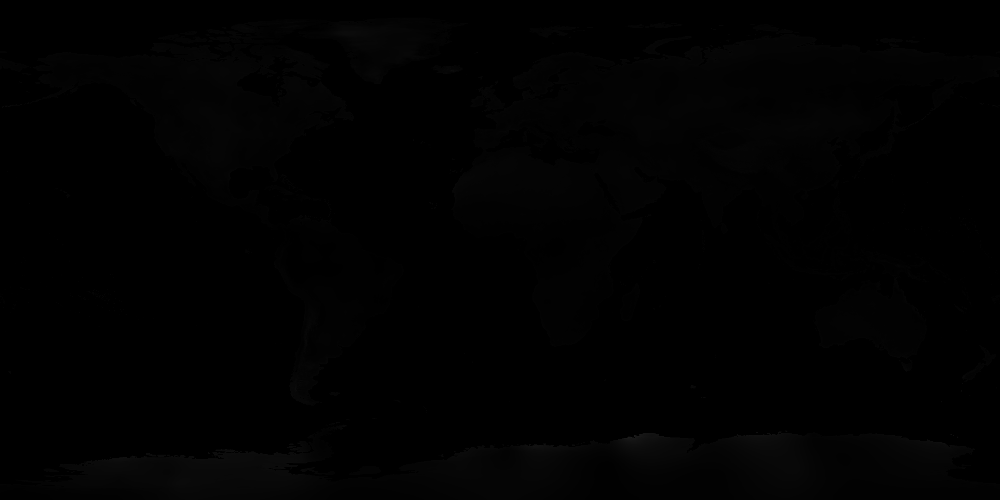

...

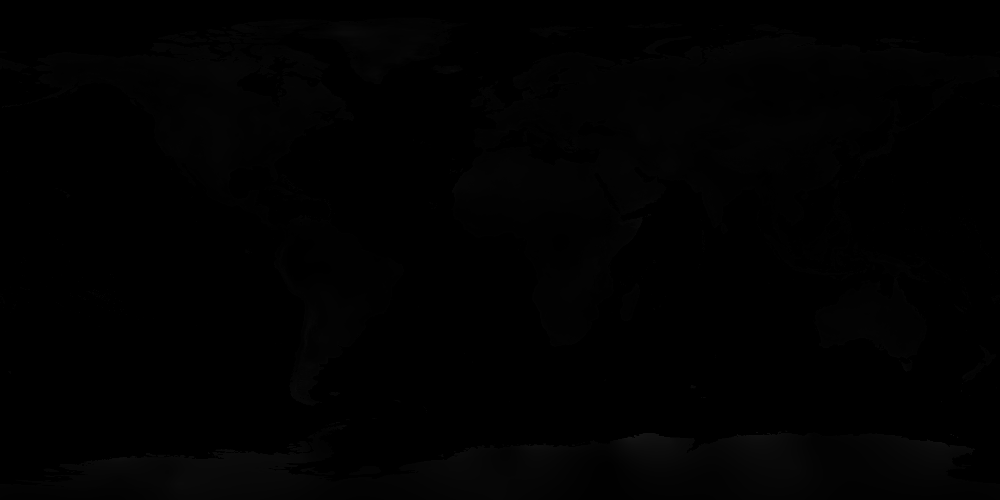

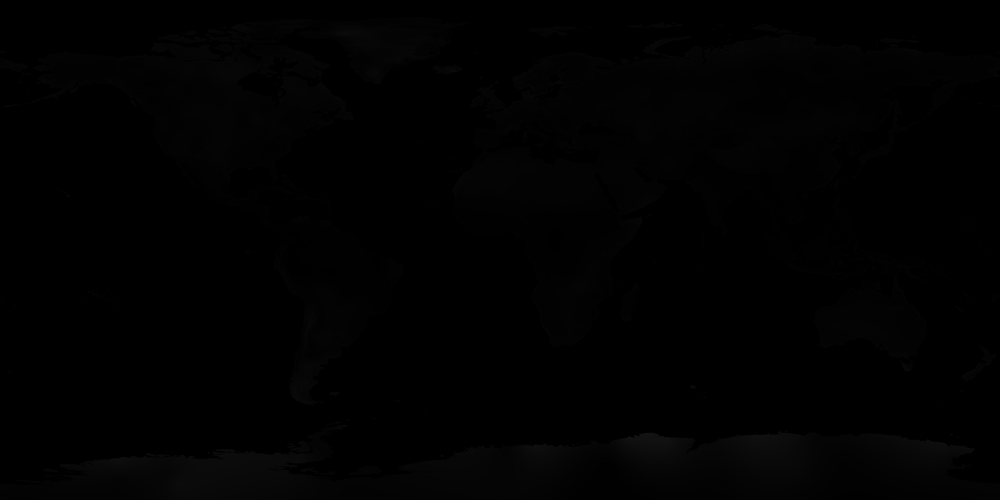

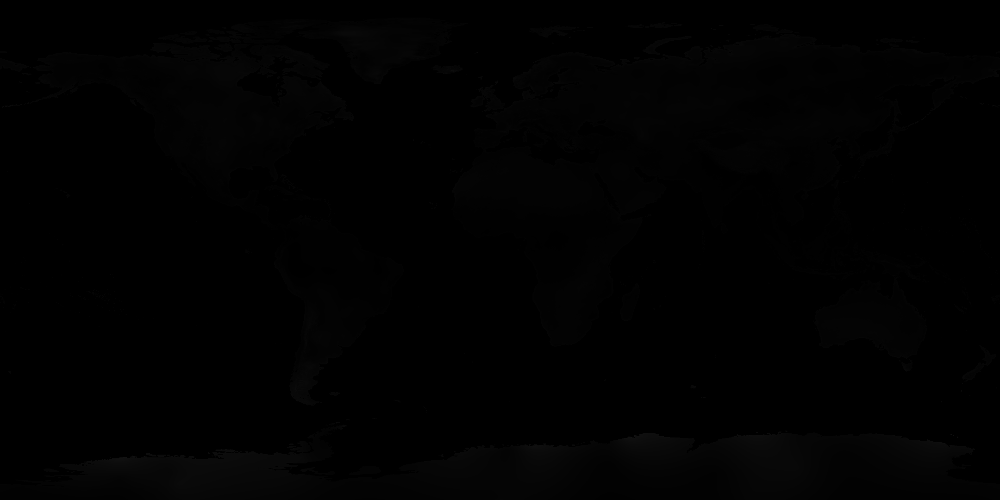

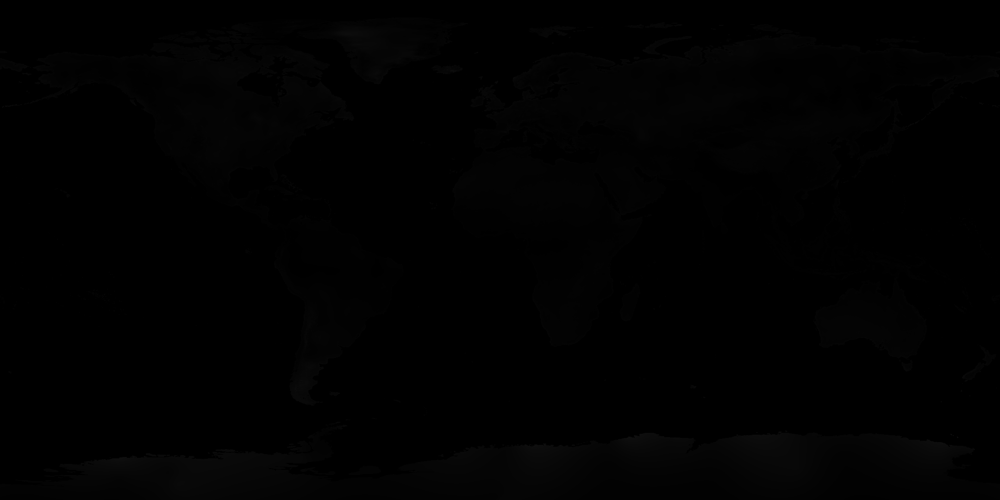

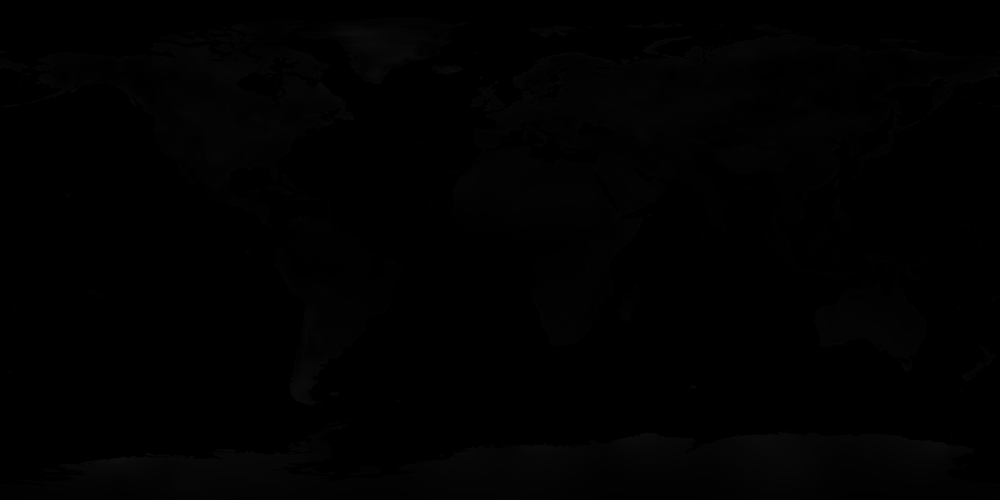

In [32]:
from PIL import Image
images = ["wc2.1_10m_wind_01", "wc2.1_10m_wind_02", "wc2.1_10m_wind_03", "wc2.1_10m_wind_04",
       "wc2.1_10m_wind_05", "wc2.1_10m_wind_06", "wc2.1_10m_wind_07", "wc2.1_10m_wind_08",
       "wc2.1_10m_wind_09", "wc2.1_10m_wind_10", "wc2.1_10m_wind_11", "wc2.1_10m_wind_12"]
for i in images:
    im = Image.open('/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/' + i + '.tif')
    im.show()

# ANALYSIS:

### 1. MAXENT PREDICTION ONLY ANALYSIS OF FIRE PERIMETER 2021 WITH MINIMUM TEMPERATURE LAYER

### Fire Perimeter 2021

In [33]:
map_view_1 = Fire_Perimeter_2021_df.spatial.plot(alpha=0.10)
Fire_Perimeter_2021_sdf.spatial.plot(map_widget=map_view_1,
                renderer_type='s',
                symbol_type='simple',
                symbol_style='d', # d - for diamonds
                colors='Reds_r',
                cstep=50,
                outline_color='Blues',
                marker_size=10)
map_view_1

MapView(layout=Layout(height='400px', width='100%'))

## Raster Layer for Minimum_Temp

In [34]:
Minimum_Temp_Trained_Features_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Minimum_Temp_Probability_Feature'))

In [35]:
#plots the data to the map view
map_view = Minimum_Temp_Trained_Features_2021_sdf.spatial.plot(alpha=0.10)
Minimum_Temp_Trained_Features_2021_sdf.spatial.plot(map_widget = map_view,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )
map_view

MapView(layout=Layout(height='400px', width='100%'))

In [36]:
Minimum_Temp_Trained_Features_2021_df = Minimum_Temp_Trained_Features_2021_sdf.head(1000)
Minimum_Temp_Trained_Features_2021_df

,OBJECTID,PROB_RANGE,Probab,CLASSIFY,SOURCE_ID,PRESENCE,OBSERVED,PROB,PREDICTED,CVGROUP,...,H26,H60,H78,H81,H131,H134,H135,H150,H188,SHAPE
0,1,0.50 - 0.75,High_prob_range_wildfires,major exact wildfires from 2021,2,1,Presence,0.541451,1,6,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
1,2,0.25 - 0.50,High_prob_range_wildfires,few exact wildfire location from 2021,3,1,Presence,0.460298,0,7,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
2,3,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfires from 2021,4,1,Presence,0.805322,1,3,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
3,4,0.50 - 0.75,High_prob_range_wildfires,major exact wildfires from 2021,5,1,Presence,0.717141,1,2,...,0.0,0.075332,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
4,5,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfires from 2021,8,1,Presence,0.834495,1,3,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": -197531.48589999974, ""y"": -84571.0200999..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.25 - 0.50,High_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.485607,0,2,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": 70456.31500000134, ""y"": -60890.246799999..."
996,997,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.645365,1,10,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": 86113.27389999852, ""y"": -60890.246799999..."
997,998,0.25 - 0.50,High_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.328058,0,5,...,0.0,0.000000,0.0,0.46134,0.0,0.0,0.411777,0.0,0.0,"{""x"": 101770.23279999942, ""y"": -60890.24679999..."
998,999,0.25 - 0.50,High_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.443389,0,4,...,0.0,0.000000,0.0,1.00000,0.0,0.0,1.000000,0.0,0.0,"{""x"": 117427.19170000032, ""y"": -60890.24679999..."


In [37]:
# Exploring the dataset attributs
Minimum_Temp_Trained_Features_2021_df.columns

Index(['OBJECTID', 'PROB_RANGE', 'Probab', 'CLASSIFY', 'SOURCE_ID', 'PRESENCE',
       'OBSERVED', 'PROB', 'PREDICTED', 'CVGROUP', 'L0', 'L6', 'Q3', 'Q4',
       'P15', 'P44', 'P50', 'P54', 'P55', 'P65', 'H26', 'H60', 'H78', 'H81',
       'H131', 'H134', 'H135', 'H150', 'H188', 'SHAPE'],
      dtype='object')

In [56]:
Minimum_Temp_Trained_Features_2021_Layer = Minimum_Temp_Trained_Features_2021_df.spatial.to_featurelayer(title='Minimum_Temp_Trained_Features_2021',tags=['2021'])
Minimum_Temp_Trained_Features_2021_Layer

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


<Item title:"Minimum_Temp_Trained_Features_2021" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

### 2. MAXENT PREDICTION ONLY ANALYSIS OF FIRE PERIMETER 2021 WITH MAXIMUM TEMPERATURE LAYER

In [38]:
Maximum_Temp_Trained_Features_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Maximum_Temp_Probability_Feature'))

In [39]:
#plots the data to the map view
maximum_view = Minimum_Temp_Trained_Features_2021_sdf.spatial.plot(alpha=0.10)
Maximum_Temp_Trained_Features_2021_sdf.spatial.plot(map_widget = maximum_view,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )
maximum_view

MapView(layout=Layout(height='400px', width='100%'))

In [40]:
Maximum_Temp_Trained_Features_2021_df = Maximum_Temp_Trained_Features_2021_sdf.head(1000)
Maximum_Temp_Trained_Features_2021_df

,OBJECTID,PROB_RANGE,Probab,CLASSIFY,SOURCE_ID,PRESENCE,OBSERVED,PROB,PREDICTED,CVGROUP,...,H60,H114,H136,H185,H189,H191,H205,H206,H209,SHAPE
0,1,0.50 - 0.75,High_prob_range_wildfires,major exact wildires location from 2021,2,1,Presence,0.643811,1,10,...,0.0,0.0,1.000000,0.000000,1.000000,0.607029,0.0,0.0,0.552011,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
1,2,0.50 - 0.75,High_prob_range_wildfires,major exact wildires location from 2021,3,1,Presence,0.569076,1,6,...,0.0,0.0,1.000000,0.000000,1.000000,0.740010,0.0,0.0,0.615654,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
2,3,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildires location from 2021,4,1,Presence,0.768507,1,6,...,0.0,0.0,1.000000,0.103497,1.000000,1.000000,0.0,0.0,1.000000,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
3,4,0.50 - 0.75,High_prob_range_wildfires,major exact wildires location from 2021,5,1,Presence,0.735537,1,4,...,0.0,0.0,1.000000,0.162826,1.000000,1.000000,0.0,0.0,1.000000,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
4,5,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildires location from 2021,8,1,Presence,0.771273,1,9,...,0.0,0.0,1.000000,0.043626,1.000000,1.000000,0.0,0.0,1.000000,"{""x"": -197531.48589999974, ""y"": -84571.0200999..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.381171,0,2,...,0.0,0.0,1.000000,0.000000,1.000000,0.871263,0.0,0.0,0.968867,"{""x"": 70456.31500000134, ""y"": -60890.246799999..."
996,997,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.517113,1,8,...,0.0,0.0,0.688707,0.000000,1.000000,0.491217,0.0,0.0,0.598981,"{""x"": 86113.27389999852, ""y"": -60890.246799999..."
997,998,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.312798,0,6,...,0.0,0.0,0.284287,0.000000,0.555832,0.185277,0.0,0.0,0.262307,"{""x"": 101770.23279999942, ""y"": -60890.24679999..."
998,999,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.500708,1,10,...,0.0,0.0,1.000000,0.000000,1.000000,0.627111,0.0,0.0,0.636412,"{""x"": 117427.19170000032, ""y"": -60890.24679999..."


In [41]:
# Exploring the dataset attributs
Maximum_Temp_Trained_Features_2021_sdf.columns

Index(['OBJECTID', 'PROB_RANGE', 'Probab', 'CLASSIFY', 'SOURCE_ID', 'PRESENCE',
       'OBSERVED', 'PROB', 'PREDICTED', 'CVGROUP', 'L2', 'L4', 'Q2', 'Q6',
       'Q8', 'P16', 'P17', 'P59', 'H27', 'H28', 'H44', 'H60', 'H114', 'H136',
       'H185', 'H189', 'H191', 'H205', 'H206', 'H209', 'SHAPE'],
      dtype='object')

In [65]:
Maximum_Temp_Trained_Features_2021_Layer = Maximum_Temp_Trained_Features_2021_sdf.spatial.to_featurelayer(title='Maximum_Temp_Trained_Features_2021',tags=['2021'])
Maximum_Temp_Trained_Features_2021_Layer

<Item title:"Maximum_Temp_Trained_Features_2021" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

### 3. MAXENT PREDICTION ONLY ANALYSIS OF FIRE PERIMETER 2021 WITH AVERAGE TEMPERATURE LAYER

In [42]:
Average_Temp_Trained_Features_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Average_Temp_Probability_Feature'))

In [43]:
#plots the data to the map view
Average_view = Average_Temp_Trained_Features_2021_sdf.spatial.plot(alpha=0.10)
Average_Temp_Trained_Features_2021_sdf.spatial.plot(map_widget = Average_view,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )
Average_view

MapView(layout=Layout(height='400px', width='100%'))

In [44]:
Average_Temp_Trained_Features_2021_df = Average_Temp_Trained_Features_2021_sdf.head(1000)
Average_Temp_Trained_Features_2021_df

,OBJECTID,PROB_RANGE,Probab,CLASSIFY,SOURCE_ID,PRESENCE,OBSERVED,PROB,PREDICTED,CVGROUP,...,H60,H100,H132,H134,H152,H154,H191,H206,H207,SHAPE
0,1,0.50 - 0.75,High_prob_range_wildfires,major exact wildfire location from 2021,2,1,Presence,0.534757,1,7,...,0.0,1.000000,0.0,0.0,0.0,1.000000,0.640427,0.0,1.000000,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
1,2,0.25 - 0.50,Medium_prob_range_wildfires,few exact wildfire location from 2021,3,1,Presence,0.430610,0,7,...,0.0,1.000000,0.0,0.0,0.0,1.000000,0.777818,0.0,1.000000,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
2,3,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire location from 2021,4,1,Presence,0.777764,1,8,...,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
3,4,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire location from 2021,5,1,Presence,0.759964,1,10,...,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
4,5,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire location from 2021,8,1,Presence,0.755993,1,5,...,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,"{""x"": -197531.48589999974, ""y"": -84571.0200999..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.50 - 0.75,High_prob_range_wildfires,Present wildfires location 2021,-9999,0,Background,0.517248,1,4,...,0.0,1.000000,0.0,0.0,0.0,1.000000,0.888015,0.0,1.000000,"{""x"": 70456.31500000134, ""y"": -60890.246799999..."
996,997,0.50 - 0.75,High_prob_range_wildfires,Present wildfires location 2021,-9999,0,Background,0.670254,1,7,...,0.0,0.613183,0.0,0.0,0.0,0.539326,0.461846,0.0,1.000000,"{""x"": 86113.27389999852, ""y"": -60890.246799999..."
997,998,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.314608,0,3,...,0.0,0.245679,0.0,0.0,0.0,0.151174,0.131334,0.0,0.416687,"{""x"": 101770.23279999942, ""y"": -60890.24679999..."
998,999,0.50 - 0.75,High_prob_range_wildfires,Present wildfires location 2021,-9999,0,Background,0.569276,1,1,...,0.0,1.000000,0.0,0.0,0.0,0.859477,0.511521,0.0,1.000000,"{""x"": 117427.19170000032, ""y"": -60890.24679999..."


In [45]:
# Exploring the dataset attributs
Average_Temp_Trained_Features_2021_df.columns

Index(['OBJECTID', 'PROB_RANGE', 'Probab', 'CLASSIFY', 'SOURCE_ID', 'PRESENCE',
       'OBSERVED', 'PROB', 'PREDICTED', 'CVGROUP', 'L0', 'L4', 'L10', 'Q1',
       'Q3', 'Q4', 'Q5', 'Q10', 'P15', 'P38', 'P55', 'H9', 'H44', 'H60',
       'H100', 'H132', 'H134', 'H152', 'H154', 'H191', 'H206', 'H207',
       'SHAPE'],
      dtype='object')

In [72]:
Average_Temp_Trained_Features_2021_Layer = Average_Temp_Trained_Features_2021_df.spatial.to_featurelayer(title='Average_Temp_Trained_Features_2021',tags=['2021'])
Average_Temp_Trained_Features_2021_Layer

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


<Item title:"Average_Temp_Trained_Features_2021" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

### 4. MAXENT PREDICTION ONLY ANALYSIS OF FIRE PERIMETER 2021 WITH PERCIPITATION TEMPERATURE LAYER

In [46]:
Percipitation_Trained_Features_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Percepitation_Probability_Feature'))

In [47]:
#plots the data to the map view
Percipitation_view = Percipitation_Trained_Features_2021_sdf.spatial.plot(alpha=0.10)
Percipitation_Trained_Features_2021_sdf.spatial.plot(map_widget = Percipitation_view,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )
Percipitation_view

MapView(layout=Layout(height='400px', width='100%'))

In [48]:
Percipitation_Trained_Features_2021_df = Percipitation_Trained_Features_2021_sdf.head(1000)
Percipitation_Trained_Features_2021_df

,OBJECTID,PROB_RANGE,Probab,CLASSIFY,SOURCE_ID,PRESENCE,OBSERVED,PROB,PREDICTED,CVGROUP,...,H117,H131,H135,H150,H151,H152,H155,H171,H206,SHAPE
0,1,0.00 - 0.25,Low_prob_range_wildfires,few exact wildfire location from 2021,1,1,Presence,0.150872,0,10,...,1.0,0.0,1.000000,0.0,0.0,0.0,0.720669,0.468279,0.0,"{""x"": 157631.76080000028, ""y"": -112181.0581999..."
1,2,0.50 - 0.75,High_prob_range_wildfires,major exact wildfire location from 2021,2,1,Presence,0.643036,1,3,...,1.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
2,3,0.25 - 0.50,Medium_prob_range_wildfires,few exact wildfire location from 2021,3,1,Presence,0.446675,0,1,...,1.0,0.0,1.000000,0.0,0.0,0.0,0.951781,1.000000,0.0,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
3,4,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire location from 2021,4,1,Presence,0.849266,1,6,...,1.0,0.0,0.727754,0.0,0.0,0.0,0.603598,1.000000,0.0,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
4,5,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire location from 2021,5,1,Presence,0.783773,1,7,...,1.0,0.0,0.610817,0.0,0.0,0.0,0.492514,1.000000,0.0,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.670576,1,9,...,1.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,"{""x"": 70456.31500000134, ""y"": -60890.246799999..."
996,997,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.591710,1,4,...,1.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,"{""x"": 86113.27389999852, ""y"": -60890.246799999..."
997,998,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.518883,1,4,...,1.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,"{""x"": 101770.23279999942, ""y"": -60890.24679999..."
998,999,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.532535,1,1,...,1.0,0.0,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,"{""x"": 117427.19170000032, ""y"": -60890.24679999..."


In [49]:
# Exploring the dataset attributs
Percipitation_Trained_Features_2021_df.columns

Index(['OBJECTID', 'PROB_RANGE', 'Probab', 'CLASSIFY', 'SOURCE_ID', 'PRESENCE',
       'OBSERVED', 'PROB', 'PREDICTED', 'CVGROUP', 'L0', 'L1', 'L2', 'L5',
       'L6', 'L7', 'L9', 'L10', 'L11', 'Q3', 'P6', 'P14', 'P16', 'P27', 'P33',
       'P35', 'P43', 'P49', 'P50', 'P52', 'P53', 'P54', 'H24', 'H25', 'H44',
       'H45', 'H62', 'H63', 'H64', 'H81', 'H97', 'H98', 'H116', 'H117', 'H131',
       'H135', 'H150', 'H151', 'H152', 'H155', 'H171', 'H206', 'SHAPE'],
      dtype='object')

In [78]:
Percipitation_Trained_Features_2021_Layer = Percipitation_Trained_Features_2021_df.spatial.to_featurelayer(title='Percipitation_Trained_Features_2021',tags=['2021'])
Percipitation_Trained_Features_2021_Layer

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


<Item title:"Percipitation_Trained_Features_2021" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

### 5. MAXENT PREDICTION ONLY ANALYSIS OF FIRE PERIMETER 2021 WITH WINDSPEED TEMPERATURE LAYER

In [50]:

# Import system modules 
import arcpy 

# Call Presence-only Prediction (MaxEnt)
arcpy.stats.PresenceOnlyPrediction(
    input_point_features=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Fire_Perimeter_21", 
    contains_background="PRESENCE_ONLY_POINTS",
    presence_indicator_field=None,
    explanatory_variables=None,
    distance_features=None,
    explanatory_rasters=[[r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_01.tif", "false"], 
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_02.tif", "false"], 
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_03.tif", "false"], 
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_04.tif", "true"], 
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_05.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_06.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_07.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_08.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_09.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_10.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_11.tif", "false"],
                         [r"/arcgis/home/Wildfire_MaxEnt/Wind_Speed_Layer/wc2.1_10m_wind_12.tif", "false"]], 
    basis_expansion_functions="LINEAR;QUADRATIC;PRODUCT;HINGE",
    number_knots=10,
    study_area_type="CONVEX_HULL",
    study_area_polygon=None,
    spatial_thinning="THINNING",
    thinning_distance_band="500 Meters", 
    number_of_iterations=10
    relative_weight=100
    link_function="CLOGLOG"
    presence_probability_cutoff=0.5
    output_trained_features=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Trained_Features"
    output_trained_raster=r"C:/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Trained_Raster"
    output_response_curve_table=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Response_Curve_Table"
    output_sensitivity_table=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Sensitivity_Table"
    features_to_predict=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/In_Prediction_Features"
    output_pred_features=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Prediction_Features"
    output_pred_raster=r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Out_Prediction_Raster",
    explanatory_variable_matching=None
    explanatory_distance_matching=None
    explanatory_rasters_matching=[[r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_Elevation", "false"], 
                                  [r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_Canopy", "false"], 
                                  [r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_ClimacticWaterDeficit", "false"], 
                                  [r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_LandCoverClassification", "true"], 
                                  [r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_UpperSlope", "false"],
                                  [r"/arcgis/home/Wildfire_MaxEnt/BioClimate_Data/results_maxent_wildfires_new_1.gdb/Prediction_LowerSlope", "false"]], 
    allow_predictions_outside_of_data_ranges="ALLOWED"
    resampling_scheme="RANDOM"
    number_of_groups=3)

SyntaxError: invalid syntax (864104020.py, line 30)

In [51]:
# Create a placeholder folder for the datasets
try:
    dir_name = ('/arcgis/home/Wildfire_MaxEnt/Windspeed_Prob')
    os.mkdir(dir_name)
except Exception as exception:
    print (f"{dir_name} already exists.")

/arcgis/home/Wildfire_MaxEnt/Windspeed_Prob already exists.


In [52]:
#Create a Directory to store our geodatabase
home_dir = '/arcgis/home/Wildfire_MaxEnt/Windspeed_Prob'
new_dirname = 'WindSpeed'
lesson_dir_1 = os.path.join(home_dir, new_dirname)

In [53]:
windspeed = '/arcgis/home/Wildfire_MaxEnt/Wind_Speed.gdb.zip'

In [54]:
import os
import zipfile
import arcpy

In [55]:
#Unzipping the geodatabase
zip_ref = zipfile.ZipFile(windspeed, 'r')
zip_ref.extractall(lesson_dir_1)

In [56]:
#Checking our workspace
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Prediction/results_maxent_wildfires_prediction_4.gdb


In [57]:
#Assign the geodatabase to Bioclimate
Prediction_1 = os.path.join(lesson_dir_1, 'Wind_Speed.gdb')

In [58]:
#Assign new workspace
arcpy.env.workspace = Prediction_1

In [59]:
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Windspeed_Prob/WindSpeed/Wind_Speed.gdb


In [60]:
#List feature classes in geodatabase
arcpy.ListFeatureClasses()

['Windspeed_probability_Features']

In [62]:
#Create a new geodatabase to store results
gp_res = arcpy.management.CreateFileGDB(lesson_dir, 'results_maxent_windspeed_3.gdb')


In [63]:
gp_res

<Result '/arcgis/home/Wildfire_MaxEnt/Prediction/results_maxent_windspeed_3.gdb'>

In [64]:
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Windspeed_Prob/WindSpeed/Wind_Speed.gdb


In [65]:
#change workspace to the new geodatabase
arcpy.env.workspace = gp_res[0]
print(arcpy.env.workspace)

/arcgis/home/Wildfire_MaxEnt/Prediction/results_maxent_windspeed_3.gdb


In [66]:
Windspeed_Trained_Features_2021_sdf = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction_1,'Windspeed_probability_Features'))

In [67]:
#plots the data to the map view
Windspeed_view = Windspeed_Trained_Features_2021_sdf.spatial.plot(alpha=0.10)
Windspeed_Trained_Features_2021_sdf.spatial.plot(map_widget = Windspeed_view,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )
Windspeed_view

MapView(layout=Layout(height='400px', width='100%'))

In [68]:
windspeed_Trained_Features_2021_df = Windspeed_Trained_Features_2021_sdf.head(1000)
windspeed_Trained_Features_2021_df

,OBJECTID,PROB_RANGE,Probab,CLASSIFY,SOURCE_ID,PRESENCE,OBSERVED,PROB,PREDICTED,CVGROUP,...,H60,H99,H112,H114,H117,H153,H154,H184,H187,SHAPE
0,1,0.50 - 0.75,High_prob_range_wildfires,major exact wildfire locations from 2021,2,1,Presence,0.724780,1,10,...,0.000000,1.0,0.000000,0.000000,1.0,1.0,0.873380,0.000000,0.000000,"{""x"": -173409.16310000047, ""y"": 426653.3414999..."
1,2,0.50 - 0.75,High_prob_range_wildfires,major exact wildfire locations from 2021,3,1,Presence,0.659074,1,8,...,0.000000,1.0,0.000000,0.000000,1.0,1.0,0.816636,0.000000,0.000000,"{""x"": -134510.8660000004, ""y"": 437027.43329999..."
2,3,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire locations from 2021,4,1,Presence,0.825273,1,10,...,0.000000,1.0,0.374965,0.000000,1.0,1.0,1.000000,0.000000,0.000000,"{""x"": -187847.40350000001, ""y"": -101413.993499..."
3,4,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire locations from 2021,5,1,Presence,0.764201,1,10,...,0.000000,1.0,0.421058,0.035097,1.0,1.0,1.000000,0.000000,0.000000,"{""x"": -163149.11989999935, ""y"": -113861.652899..."
4,5,0.75 - 1.00,Very_High_prob_range_wildfires,major exact wildfire locations from 2021,7,1,Presence,0.842042,1,3,...,0.000000,1.0,0.335816,0.000000,1.0,1.0,1.000000,0.000000,0.000000,"{""x"": -192947.27190000005, ""y"": -90211.3805999..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.353958,0,4,...,0.000000,1.0,0.338380,0.000000,1.0,1.0,1.000000,0.000000,0.000000,"{""x"": 70456.31500000134, ""y"": -60890.246799999..."
996,997,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.361662,0,10,...,0.031053,1.0,0.550419,0.250698,1.0,1.0,1.000000,0.314374,0.000000,"{""x"": 86113.27389999852, ""y"": -60890.246799999..."
997,998,0.50 - 0.75,High_prob_range_wildfires,Present wildfires locations 2021,-9999,0,Background,0.550140,1,4,...,0.336018,1.0,0.727280,0.545467,1.0,1.0,1.000000,0.600970,0.002424,"{""x"": 101770.23279999942, ""y"": -60890.24679999..."
998,999,0.25 - 0.50,Medium_prob_range_wildfires,remaining areas where no wildfires,-9999,0,Background,0.363249,0,8,...,0.064993,1.0,0.579661,0.299435,1.0,1.0,1.000000,0.321021,0.000000,"{""x"": 117427.19170000032, ""y"": -60890.24679999..."


In [69]:
# Exploring the dataset attributs
windspeed_Trained_Features_2021_df.columns

Index(['OBJECTID', 'PROB_RANGE', 'Probab', 'CLASSIFY', 'SOURCE_ID', 'PRESENCE',
       'OBSERVED', 'PROB', 'PREDICTED', 'CVGROUP', 'L0', 'L2', 'L4', 'L5',
       'L8', 'L9', 'Q2', 'Q3', 'Q4', 'Q9', 'P21', 'P27', 'P32', 'P35', 'H27',
       'H58', 'H60', 'H99', 'H112', 'H114', 'H117', 'H153', 'H154', 'H184',
       'H187', 'SHAPE'],
      dtype='object')

In [146]:
Windspeed_Trained_Features_2021_Layer = windspeed_Trained_Features_2021_df.spatial.to_featurelayer(title='Windspeed_Trained_Features_2021',tags=['2021'])
Windspeed_Trained_Features_2021_Layer

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


<Item title:"Windspeed_Trained_Features_2021" type:Feature Layer Collection owner:mohammad-abdul-muneer-mogni.shaik>

## OBSERVATION:
Based on different factors such as minimum temperature, maximum temperature, average temperature, percipitation and windspeed on the fire prediction points

### Correlation of Wildfire prediction with Minimum Temperature, Maximum Temperature, Average Temperature, Percipitation and WindSpeed

In [70]:
import arcgis
from arcgis.gis import GIS
from arcgis.features import FeatureLayer
import getpass

In [71]:
fire_layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Fire_Perimeter_21'))

In [72]:
Minimum_Temp_Layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Minimum_Temp_Probability_Feature'))

In [73]:
Maximum_Temp_Layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Maximum_Temp_Probability_Feature'))

In [74]:
Average_Temp_Layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Average_Temp_Probability_Feature'))

In [75]:
Percipitation_Temp_Layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction,'Percepitation_Probability_Feature'))

In [76]:
Windspeed_Layer = pd.DataFrame.spatial.from_featureclass(os.path.join(Prediction_1,'Windspeed_probability_Features'))

In [77]:
map = gis.map("Thousand Oaks", zoomlevel=12)
map.add_layer(fire_layer)
map.add_layer(Minimum_Temp_Layer)
map.add_layer(Maximum_Temp_Layer)
map.add_layer(Average_Temp_Layer)
map.add_layer(Windspeed_Layer)
map.add_layer(Percipitation_Temp_Layer)
map

MapView(layout=Layout(height='400px', width='100%'))

In [78]:
fire_layer.spatial.plot(map_widget=map,
                renderer_type='s',
                symbol_type='simple',
                symbol_style='d', # d - for diamonds
                colors='Reds_r',
                cstep=50,
                outline_color='Blues',
                marker_size=10)

True

In [79]:
Minimum_Temp_Layer.spatial.plot(map_widget = map,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )

True

In [80]:
Maximum_Temp_Layer.spatial.plot(map_widget = map,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )

True

In [81]:
Average_Temp_Layer.spatial.plot(map_widget = map,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )

True

In [82]:
Windspeed_Layer.spatial.plot(map_widget = map,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )

True

In [83]:
Percipitation_Temp_Layer.spatial.plot(map_widget = map,
                renderer_type='u', # specify the unique value renderer using its notation 'u'
                col='PROB_RANGE'  # column to get unique values from
               )

True

## Conclusion:

MaxEnt is a popular modeling tool for species distribution modeling in ArcGIS Pro. It can, however, be used to forecast wildfires. Users in MaxEnt can develop a fire prediction layer by combining variables such as minimum temperature, maximum temperature, average temperature, precipitation, and windspeed. MaxEnt's color scheme can be used to depict the likelihood of a wildfire developing in a certain location.

MaxEnt employs a color scheme that is gradient. The hues in this scheme vary from green to red, with green representing places with a low likelihood of a wildfire and red representing areas with a high likelihood of a wildfire. The gradient between the two hues reflects places with intermediate chances of a wildfire.

To depict the occurrence of wildfires in 2021, draw red dots on the map to represent actual wildfires that occurred in various locations. These red dots can be superimposed on top of the MaxEnt layer to show users how well the model predicted wildfires. The remaining colorful dots may reflect regions where wildfires are predicted to erupt in the near future. The colors of the dots can be based on the MaxEnt model output, with red signifying places where a wildfire is likely to occur and green representing areas where a wildfire is unlikely to occur.

Stakeholders may make educated decisions about where to devote resources and take preventive steps by utilizing MaxEnt in ArcGIS Pro. MaxEnt's color scheme gives a simple way to evaluate the danger of wildfire incidence and identify sensitive locations. This data can be used to better plan and prepare for future wildfires, reducing their impact on people, property, and the environment.


## WORKS CITED:

#### Phillips, S. J., & Dudík, M. (2008). Modeling of species distributions with Maxent: new extensions and a comprehensive evaluation. Ecography, 31(2), 161-175. doi: 10.1111/j.0906-7590.2008.5203.x.

#### ESRI. (n.d.). MaxEnt. Retrieved from https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/maxent.htm

#### Ganjurjav, H., Bater, C. W., Brown, J. F., & Yang, Z. (2015). Modeling the potential distribution of invasive buffelgrass (Cenchrus ciliaris L.) with MaxEnt in Arizona, USA: model complexity and impact of climate change on invasion in the Sonoran Desert region. Ecological Informatics, 29, 13-22. doi: 10.1016/j.ecoinf.2015.06.002.

#### Hijmans, R. J., Cameron, S. E., Parra, J. L., Jones, P. G., & Jarvis, A. (2005). Very high resolution interpolated climate surfaces for global land areas. International Journal of Climatology, 25(15), 1965-1978. doi: 10.1002/joc.1276.

#### Elith, J., Phillips, S. J., Hastie, T., Dudík, M., Chee, Y. E., & Yates, C. J. (2011). A statistical explanation of MaxEnt for ecologists. Diversity and Distributions, 17(1), 43-57. doi: 10.1111/j.1472-4642.2010.00725.x.

#### Araújo, M. B., & Guisan, A. (2006). Five (or so) challenges for species distribution modelling. Journal of Biogeography, 33(10), 1677-1688. doi: 10.1111/j.1365-2699.2006.01584.x.